In [7]:
import skimage

from skimage.io import imread, imshow

import skimage.data

from skimage import color 
from skimage import transform 
from skimage import exposure
from skimage import filters 
from skimage import morphology 
from skimage import feature
from skimage import segmentation

In [8]:
import urllib.request
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 50

import itertools

In [9]:
import cv2

In [11]:
import urllib.request
imgURL = "https://github.com/MVRonkin/Turtle-CV-Textbook/raw/main/midjounary%20turtles/img2_3.png"

urllib.request.urlretrieve(imgURL, "image_1.png")

('image_1.png', <http.client.HTTPMessage at 0x1a0ca7526f0>)

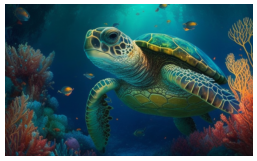

In [13]:
from PIL import ImageEnhance as ief
from PIL import Image
image = Image.open("image_1.png") 
plt.imshow(image); plt.axis('off'); plt.show()

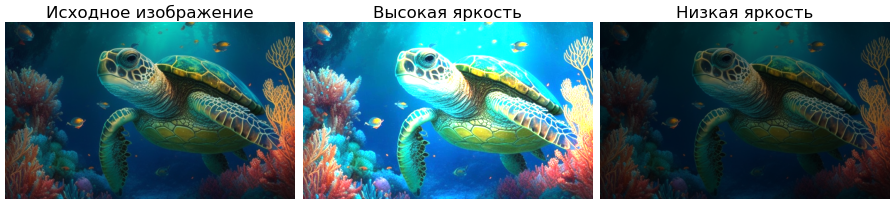

In [14]:
fig, axs = plt.subplots(1,3, figsize = (18,6))

axs[0].imshow(ief.Brightness(image).enhance(1.0))
axs[0].set_title('Исходное изображение', fontsize = 24)
axs[0].axis('off')

axs[1].imshow(ief.Brightness(image).enhance(2.5))
axs[1].set_title('Высокая яркость', fontsize = 24)
axs[1].axis('off')

axs[2].imshow(ief.Brightness(image).enhance(0.5))
axs[2].set_title('Низкая яркость', fontsize = 24)
axs[2].axis('off')

plt.tight_layout()
plt.show()

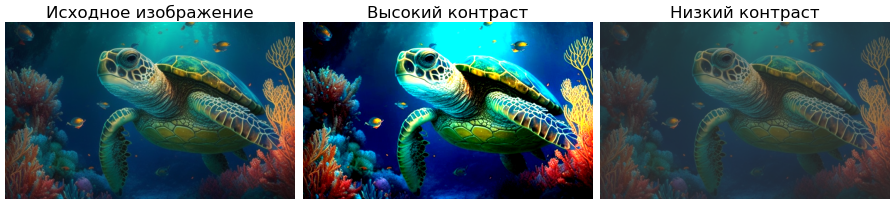

In [15]:
fig, axs = plt.subplots(1,3, figsize = (18,6))

axs[0].imshow(ief.Contrast(image).enhance(1.0))
axs[0].set_title('Исходное изображение', fontsize = 24)
axs[0].axis('off')

axs[1].imshow(ief.Contrast(image).enhance(2.5))
axs[1].set_title('Высокий контраст', fontsize = 24)
axs[1].axis('off')

axs[2].imshow(ief.Contrast(image).enhance(0.5))
axs[2].set_title('Низкий контраст', fontsize = 24)
axs[2].axis('off')

plt.tight_layout()
plt.show()

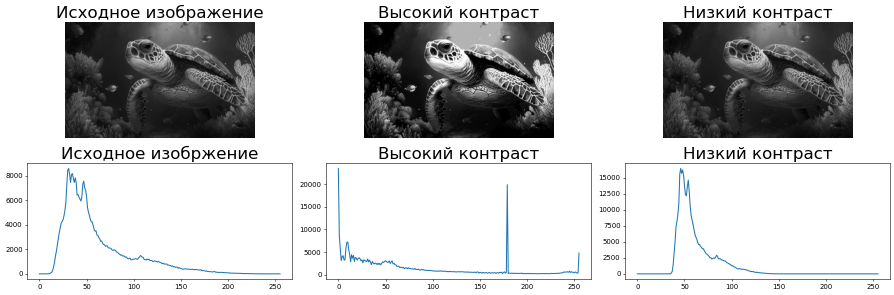

In [20]:
fig, axs = plt.subplots(2,3, figsize = (18,6))

axs[0,0].imshow(ief.Contrast(image).enhance(1.0).convert('L'), 'gray')
axs[0,0].set_title('Исходное изображение', fontsize = 24)
axs[0,0].axis('off')

axs[1,0].plot(ief.Contrast(image).enhance(1.0).convert('L').histogram())
axs[1,0].set_title('Исходное изобржение', fontsize = 24)
# axs[1,0].axis('off')


axs[0,1].imshow(ief.Contrast(image).enhance(2.5).convert('L'), 'gray')
axs[0,1].set_title('Высокий контраст', fontsize = 24)
axs[0,1].axis('off')

axs[1,1].plot(ief.Contrast(image).enhance(2.5).convert('L').histogram(),)
axs[1,1].set_title('Высокий контраст', fontsize = 24)
# axs[1,1].axis('off')


axs[0,2].imshow(ief.Contrast(image).enhance(0.5).convert('L'), 'gray')
axs[0,2].set_title('Низкий контраст', fontsize = 24)
axs[0,2].axis('off')

axs[1,2].plot(ief.Contrast(image).enhance(0.5).convert('L').histogram())
axs[1,2].set_title('Низкий контраст', fontsize = 24)
# axs[1,2].axis('off')

plt.tight_layout()
plt.savefig('histograms4k.pdf', dpi=300)
plt.show()

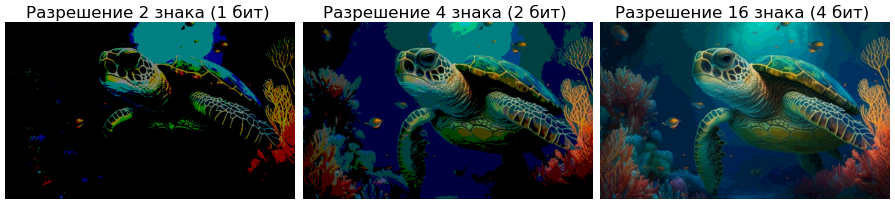

In [21]:
image = np.array(Image.open("image_1.png") )

image_shape = image.shape
resolutions = [2,4,16]

fig, axes = plt.subplots(1,len(resolutions),figsize=(18,6))

for ax,res  in zip(axes,resolutions):
    
    quant = 256//res
    im = (quant*(image//quant))

    ax.imshow(im )
    ax.set_title(f'Разрешение {res} знака ({int(np.ceil(np.log2(res)))} бит) ', fontsize = 24 )
    ax.set_axis_off()

plt.tight_layout()
plt.show()

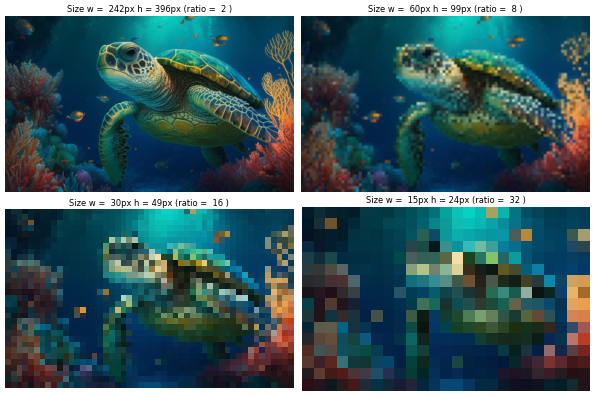

In [22]:
image = np.array(Image.open("image_1.png") )

image_shape = image.shape

size_ratios = [2, 8, 16, 32]

fig, axes = plt.subplots(2,len(size_ratios)//2,figsize=(12,8))

for ax, size_ratio  in zip(axes.ravel(), size_ratios):

    ax.imshow(image[::size_ratio,::size_ratio,:] )
    
    ax.set_title(f'Size w =  {image_shape[0]//size_ratio}px h = {image_shape[1]//size_ratio}px (ratio =  {size_ratio} )'  )
    
    ax.set_axis_off()

plt.tight_layout()
plt.show()

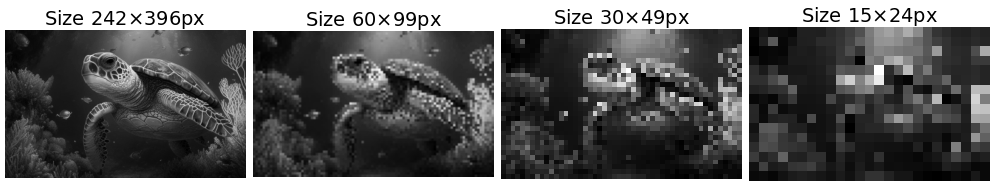

In [23]:
image = np.array(Image.open("image_1.png").convert('L') )

image_shape = image.shape

size_ratios = [2, 8, 16, 32]

fig, axes = plt.subplots(1,4,figsize=(20,8))

for ax, size_ratio  in zip(axes.ravel(), size_ratios):

    ax.imshow(image[::size_ratio,::size_ratio],'gray' )
    
    ax.set_title(fr'Size {image_shape[0]//size_ratio}$\times${image_shape[1]//size_ratio}px ' , fontsize = 28 )
    
    ax.set_axis_off()

plt.tight_layout()
plt.show()

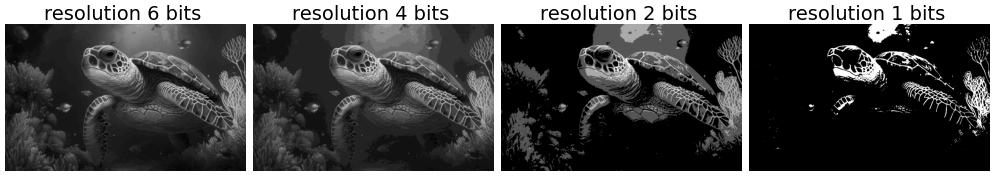

In [24]:
image = np.array(Image.open("image_1.png").convert('L')  )

image_shape = image.shape
resolutions = [2,4,16, 64][::-1]

fig, axes = plt.subplots(1,len(resolutions),figsize=(20,6))

for ax,res  in zip(axes,resolutions):
    
    quant = 256//res
    im = (quant*(image//quant))

    ax.imshow(im, 'gray' )
    ax.set_title(f'resolution {int(np.ceil(np.log2(res)))} bits ', fontsize=28 )
    ax.set_axis_off()

plt.tight_layout()
plt.show()

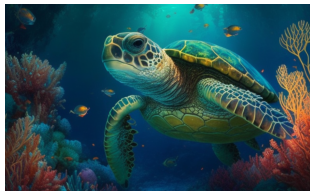

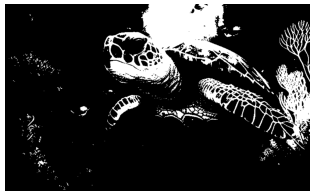

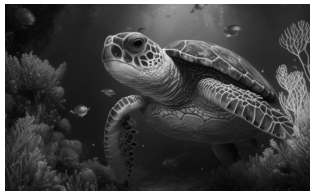

In [28]:
def rgb_2_gray(image):
    image = np.array(image)
    R,G,B = image[:,:,0],image[:,:,1],image[:,:,2]
    return (R*0.299+G*0.587+B*0.114).astype(int)

def rgb_2_bunary(image,threshold=100):
    gray = rgb_2_gray(image)
    return gray>threshold

image = Image.open("image_1.png")

plt.imshow(image,cmap='gray');
plt.axis('off');plt.tight_layout();
plt.savefig('RGB4k.pdf', dpi=300)

plt.show()

plt.imshow(rgb_2_bunary(image),cmap='gray')
plt.axis('off');plt.tight_layout();
plt.savefig('Binary4k.pdf', dpi=300)
plt.show()

image = np.array(Image.open("image_1.png"))
plt.imshow(rgb_2_gray(image),cmap='gray')
plt.axis('off');plt.tight_layout();
plt.savefig('Gray4k.pdf', dpi=300)
plt.show()



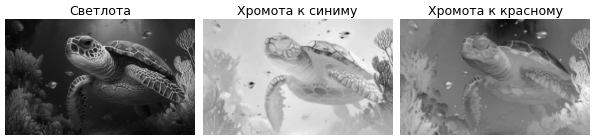

In [27]:
image = np.array(Image.open("image_1.png").convert('YCbCr'))

fig, axes = plt.subplots(1,image.shape[2],figsize=(12,6))

channel_names = ['Светлота','Хромота к синиму','Хромота к красному']

for channel,channel_name  in enumerate(channel_names):
    axes[channel].imshow(image[:,:,channel], cmap='gray')
    axes[channel].set_title(channel_name, fontsize=18)
    axes[channel].set_axis_off()

plt.tight_layout()
plt.savefig('YCbCrChannels.pdf', dpi=300)
plt.show()

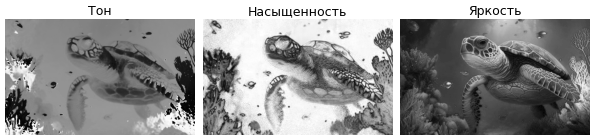

In [29]:
image = np.array(Image.open("image_1.png").convert('HSV'))

fig, axes = plt.subplots(1,image.shape[2],figsize=(12,6))

channel_names = ['Тон','Насыщенность','Яркость']

for channel,channel_name  in enumerate(channel_names):
    axes[channel].imshow(image[:,:,channel], cmap='gray')
    axes[channel].set_title(channel_name, fontsize=18)
    axes[channel].set_axis_off()

plt.tight_layout()
plt.savefig('HSVChannels.pdf', dpi=300)
plt.show()

In [30]:
image.shape

(485, 793, 3)

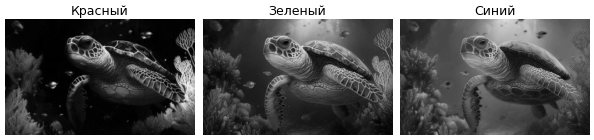

In [31]:

image = np.array(Image.open("image_1.png"))
fig, axes = plt.subplots(1,3,figsize=(12,6))

channel_names = ['Красный','Зеленый','Синий']

for channel,channel_name  in enumerate(channel_names):
    axes[channel].imshow(image[:,:,channel], cmap='gray')
    axes[channel].set_title(channel_name, fontsize=18)
    axes[channel].set_axis_off()

plt.tight_layout()
plt.savefig('RGBChannels.pdf', dpi=300)
plt.show()


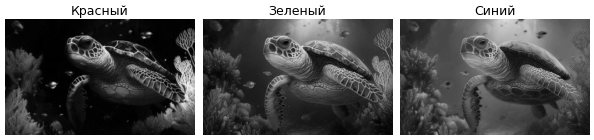

In [32]:

image = np.array(Image.open("image_1.png"))
fig, axes = plt.subplots(1,3,figsize=(12,6))

channel_names = ['Красный','Зеленый','Синий']
channel_colors = ['Reds_r','Greens_r','Blues_r']

for channel,(channel_name,channel_color)  in enumerate(zip(channel_names,channel_colors)):
    axes[channel].imshow(image[:,:,channel], cmap='gray')
    axes[channel].set_title(channel_name, fontsize=18)
    axes[channel].set_axis_off()

plt.tight_layout()
plt.savefig('RGBChannels_.pdf', dpi=300)
plt.show()

In [33]:
def axplot(image, ax=None, title='', standardize = False, fontsize = 24, **kwargs):
    ''' kwargs: figsize:(int,int); rows_cols:(int,int); finish:bool; ret_ax:bool'''
    image_ = image 
    
    if standardize:
        image_ = np.copy(image).astype(float)
        image_ = 255*(image_ - image_.min())/(image_.max()-image_.min())
        image_ = image_.astype(np.uint8)

    if ax is None:
        figsize   = (6,4) if kwargs.get('figsize')   is None else kwargs.get('figsize')
        rows_cols = (1,1) if kwargs.get('rows_cols') is None else kwargs.get('rows_cols')
        fig,ax  = plt.subplots(*rows_cols, figsize=figsize)
    
    ax_ = ax.ravel()[0] if type(ax) in [np.ndarray,list] else ax
    ax_.imshow(image_, cmap='gray'); ax_.axis('off'); ax_.set_title(title, fontsize = fontsize)
    
    if kwargs.get('finish'): plt.tight_layout(); plt.show();
    if kwargs.get('ret_ax'): return ax
    
def axplots(list_images, list_titles='',figsize=None,rows_cols=None):
    n_images = len(list_images)

    if rows_cols is None: 
        rows_cols = (int(np.ceil(n_images/3)),min(3,n_images))
    
    if figsize is None:
        figsize = (4*rows_cols[1],4*rows_cols[0]) 

    fig,axs = plt.subplots(*rows_cols,figsize=figsize)
    
    if not isinstance(list_titles,list): 
        list_titles=list(list_titles)
    
    if len(list_titles) <n_images: 
        list_titles+=(n_images - len(list_titles))*['']
        
    axs = axs.ravel()
    for i,(image,title) in enumerate(zip(list_images,list_titles)):
        axplot(image, ax=axs[i], title=title)
    
    plt.tight_layout(); plt.show();    

In [34]:
# AFINE TRANSFORMS OF THE IMAGE
def afine_transform(image):
    w,h = image.shape[:2]
    srcTri = np.array( [[0,  0], 
                        [w , 0], 
                        [0,  h]])

    dstTri = np.array([[w*0.1,  h*0.0], 
                       [w*0.95, h*0.1], 
                       [w*0.4,  h*0.95]])

    warp_mat = cv2.getAffineTransform(srcTri.astype(np.float32), dstTri.astype(np.float32))
    warp_dst = cv2.warpAffine(image, warp_mat, (image.shape[1], image.shape[0]))
    return warp_dst
#-------------------------------------------------
def vignette(image, alpha =0.5, sigma = 100 ):
    h, w = image.shape[:2]
    
    # generating vignette mask using Gaussian
    x_kernel = cv2.getGaussianKernel(w,sigma)
    y_kernel = cv2.getGaussianKernel(h,sigma)
    
    #generating resultant_kernel matrix
    res_kernel = y_kernel * x_kernel.T
    
    #creating mask and normalising by using np.linalg
    mask = 255 * res_kernel / np.linalg.norm(res_kernel)
    output = [out_ch * (alpha+(1-alpha)*mask) for out_ch in cv2.split(image)]
    return  np.asarray(output).transpose((1,2,0)).astype(np.uint8)

#-------------------------------------------------
def lense_distorition(image, focal_length = 7, distCoeff = [6e-5, 2e-9, 2e-3, 1e-6 ] ):
    h, w = image.shape[:2]
    # assume matrix for camera
    cam = np.eye(3,dtype=np.float32)
    cam[0,2], cam[1,2] = w/2, h/2  # define center x
    cam[0,0], cam[1,1] = focal_length, focal_length # define focal length for x and y
    # here the undistortion will be computed
    dst = cv2.undistort(image,cam,np.asarray(distCoeff))
    return dst 



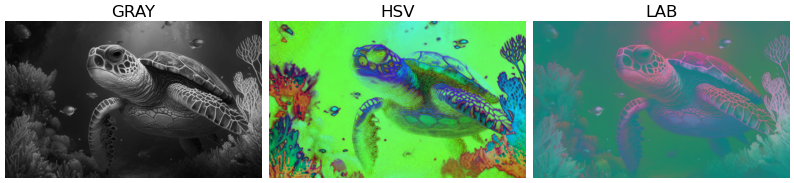

In [35]:
image = cv2.imread("image_1.png")

# GRAY SCALE
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
# HSV FORMAT
hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
# LAB FORMAT
lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)

axplots([gray,hsv,lab], ['GRAY','HSV','LAB'], figsize=(16,4) )

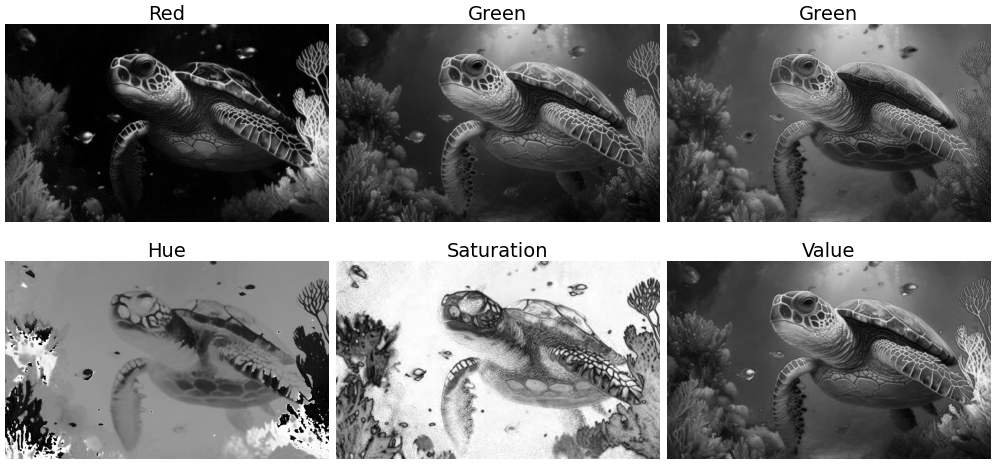

In [36]:
image = cv2.imread("image_1.png")

fig,axs = plt.subplots(2,3, figsize=(20,10))

# GRAY SCALE
im = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

axs[0,0].imshow(im[:,:,0],'gray')
axs[0,0].axis('off')
axs[0,0].set_title('Red', fontsize = 28)

axs[0,1].imshow(im[:,:,1],'gray')
axs[0,1].axis('off')
axs[0,1].set_title('Green', fontsize = 28)

axs[0,2].imshow(im[:,:,2],'gray')
axs[0,2].axis('off')
axs[0,2].set_title('Green', fontsize = 28)

# HSV FORMAT
im = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

axs[1,0].imshow(im[:,:,0],'gray')
axs[1,0].axis('off')
axs[1,0].set_title('Hue', fontsize = 28)

axs[1,1].imshow(im[:,:,1],'gray')
axs[1,1].axis('off')
axs[1,1].set_title('Saturation', fontsize = 28)

axs[1,2].imshow(im[:,:,2],'gray')
axs[1,2].axis('off')
axs[1,2].set_title('Value', fontsize = 28)

plt.tight_layout(); 
plt.show()

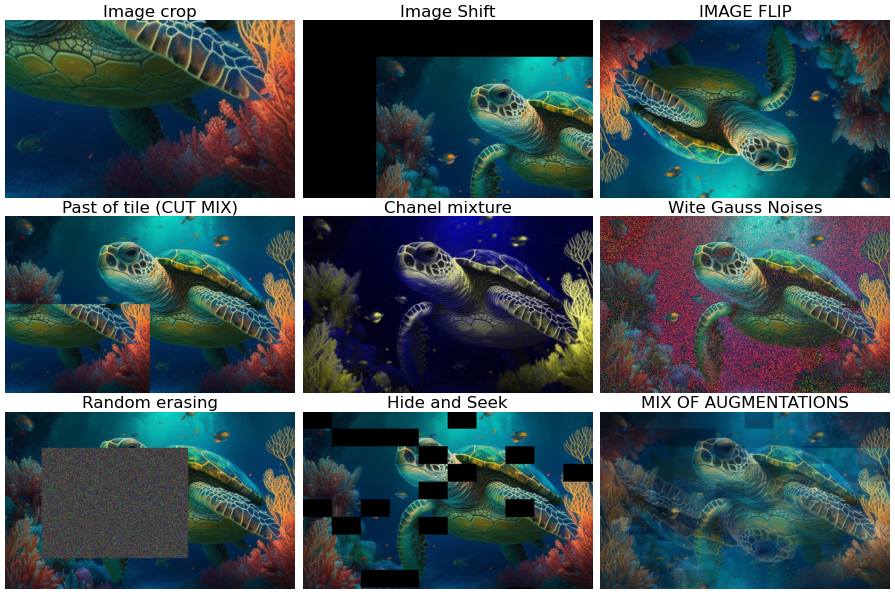

In [42]:
image = cv2.imread("image_1.png",cv2.IMREAD_COLOR)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)


fig,axs = plt.subplots(3,3,figsize=(18,12))

w,h = image.shape[0],image.shape[1]
image = image[:2*(w//2),:2*(h//2),:]
w,h = image.shape[0],image.shape[1]

#1. CROP = CUT
cut = image[w//2:2*w//2,h//2:2*h//2,:]
axplot(cut, axs[0,0], 'Image crop')

#2. IMAGE SHIFT
image_shift = np. copy(image)
image_shift[100:,200:,:] = image[:-100,:-200,:]
image_shift[:100,:,:] = 0
image_shift[:,:200,:] = 0
axplot(image_shift, axs[0,1], 'Image Shift')

#3. IMAGE FLIP
flip = np.copy(image)[::-1,::-1,:]
axplot(flip, axs[0,2], 'IMAGE FLIP' )

#4. PAST TAIL INTO IMAGE
past = np.copy(image)[:2*w//2,:2*h//2,:]
past[w//2:2*w//2,:h//2,:] = cut
axplot(past, axs[1,0], 'Past of tile (CUT MIX)' )

#5. CHANNEL MIXTURE
chanel_mixture = np. copy(image)
chanel_mixture[:,:,2],chanel_mixture[:,:,1] = 0.8*chanel_mixture[:,:,1],chanel_mixture[:,:,0]
axplot(chanel_mixture, axs[1,1], 'Chanel mixture' )

#6. ADD NOISES
var  = 300
gauss_noise = np.random.normal(0,np.sqrt(var),image.shape).astype('uint8')
gauss = image + gauss_noise
axplot(gauss, axs[1,2], 'Wite Gauss Noises' , True)

#7. RANDOM ERASING 
image_erase  = np.copy(image)
mean, var = np.mean(image), 1000
w_erase, h_erase = 300,400
gauss_noise  = np.random.normal(mean,np.sqrt(var),(w_erase,h_erase,image.shape[2])).astype('uint8')
image_erase[100:w_erase+100,100:h_erase+100,:] = gauss_noise
axplot(image_erase, axs[2,0], 'Random erasing' , True)

#8. HIDE AND SEEK OF IMAGE
scale_pathe,n_hides  = 10, 20
hs_ = np.copy(image)
w_path, h_path = w//scale_pathe, h//scale_pathe
w_hides = np.random.choice(np.arange(0, w, w_path),size = n_hides)
h_hides = np.random.choice(np.arange(0, h, h_path),size = n_hides)
for w_, h_ in zip(w_hides, h_hides):
    hs_[w_:w_+w_path,h_:h_+h_path,:] = 0
axplot(hs_, axs[2,1], 'Hide and Seek' , True)


#9. MIX OF AUGMENTATIONS
image_ = np.copy(image).astype(float)
#weights
w = np.asarray([3,2,1.8,3,2.2])
w /= w.sum()
image_ = (image*w[0] + hs_*w[1] + chanel_mixture *w[2] + flip *w[3] + image_shift*w[4])
axplot(image_, axs[2,2], 'MIX OF AUGMENTATIONS' , True, finish=True )  




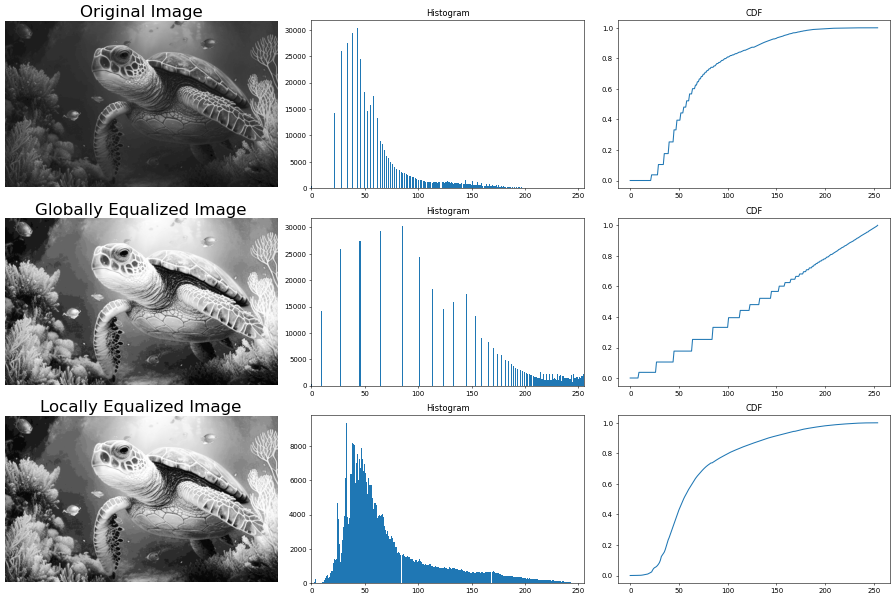

In [43]:
img = cv2.imread("image_1.png",cv2.IMREAD_GRAYSCALE )

# GLOBAL EUQALIZING
equ = cv2.equalizeHist(img)

# LOCAL EUQALIZING
clahe = cv2.createCLAHE(clipLimit = 2.0,tileGridSize = (16,16))
clahed = clahe.apply(img)

fig,axs = plt.subplots(3,3,figsize=(18,12))

#ORIGINAL IMAGE
axplot(img, axs[0,0], 'Original Image' )
b, bins, patches = axs[0,1].hist(img.flatten(), 255)
axs[0,1].set_xlim([0,255]); axs[0,1].set_title('Histogram')
axs[0,2].plot(np.cumsum(b)/np.sum(b)); axs[0,2].set_title('CDF')

#GLOBALLY EQUALIZED IMAGE
axplot(equ, axs[1,0], 'Globally Equalized Image' )
b, bins, patches = axs[1,1].hist(equ.flatten(), 255)
axs[1,1].set_xlim([0,255]); axs[1,1].set_title('Histogram')
axs[1,2].plot(np.cumsum(b)/np.sum(b)); axs[1,2].set_title('CDF')

#LOCALLY EQUALIZED IMAGE
axplot(equ, axs[2,0], 'Locally Equalized Image' )
b, bins, patches = axs[2,1].hist(clahed.flatten(), 255)
axs[2,1].set_xlim([0,255]); axs[2,1].set_title('Histogram')
axs[2,2].plot(np.cumsum(b)/np.sum(b)); axs[2,2].set_title('CDF')

plt.tight_layout()
plt.show()

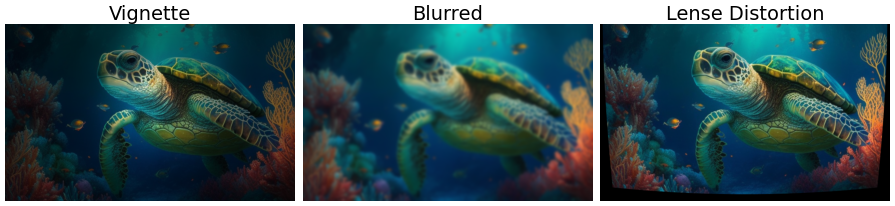

In [44]:
image = cv2.imread("image_1.png",cv2.IMREAD_COLOR)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

fig,axs = plt.subplots(1,3,figsize = (18,6))


rows, cols = image.shape[:2]
   
# generating vignette mask using Gaussian
# resultant_kernels
X_resultant_kernel = cv2.getGaussianKernel(cols,100)
Y_resultant_kernel = cv2.getGaussianKernel(rows,100)
   
#generating resultant_kernel matrix
resultant_kernel = Y_resultant_kernel * X_resultant_kernel.T
   
#creating mask and normalising by using np.linalg
# function
mask = 255 * resultant_kernel / np.linalg.norm(resultant_kernel)
output = np.copy(image)

alpha =0.5 
# applying the mask to each channel in the input image
for i in range(3):
    output[:,:,i] = output[:,:,i] * (alpha+(1-alpha)*mask)
    
axs[0].imshow(output);
axs[0].set_title('Vignette', fontsize = 28)
axs[0].axis('off')


src    = np.copy(image)
width  = src.shape[1]
height = src.shape[0]

distCoeff = np.zeros((4,1),np.float64)

# TODO: add your coefficients here!
k1 = 3.0e-5; # negative to remove barrel distortion
k2 = 1.0e-9;
p1 = 1.0e-3;
p2 = 1.0e-6;

distCoeff[0,0] = k1;
distCoeff[1,0] = k2;
distCoeff[2,0] = p1;
distCoeff[3,0] = p2;

# assume unit matrix for camera
cam = np.eye(3,dtype=np.float32)

cam[0,2] = width/2.0  # define center x
cam[1,2] = height/2.0 # define center y
cam[0,0] = 10.        # define focal length x
cam[1,1] = 10.        # define focal length y

# here the undistortion will be computed
dst = cv2.undistort(src,cam,distCoeff)

axs[2].imshow(dst);
axs[2].set_title('Lense Distortion', fontsize = 28)
axs[2].axis('off')

blurred = cv2.GaussianBlur(image, (21, 21), 0)
axs[1].imshow(blurred);
axs[1].set_title('Blurred', fontsize = 28)
axs[1].axis('off')

plt.tight_layout();
plt.show()

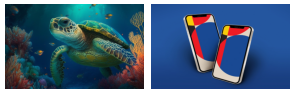

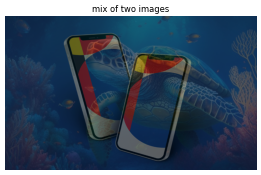

In [45]:

image2_url = 'https://as2.ftcdn.net/jpg/04/46/10/77/1024W_F_446107734_NaiNx4Qxq1bT4ipU1vGohw1dtU9kOWpx_NW1.jpg'
urllib.request.urlretrieve(image2_url,"image2.png")

image2 = cv2.imread("image2.png",cv2.IMREAD_COLOR)
image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

image2 = cv2.resize(image2, image.shape[:2][::-1])

plt.figure(figsize=(6,2))
plt.subplot(1,2,1)
plt.imshow(image);plt.axis('off')
plt.subplot(1,2,2)
plt.imshow(image2);plt.axis('off')
plt.tight_layout()
plt.show();

mix = cv2.addWeighted(image,0.3,image2,0.4,0)

plt.figure(figsize=(8,4))
plt.imshow(mix);plt.axis('off');plt.title('mix of two images'); plt.show()

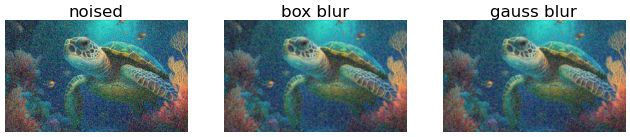

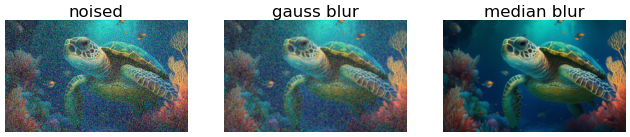

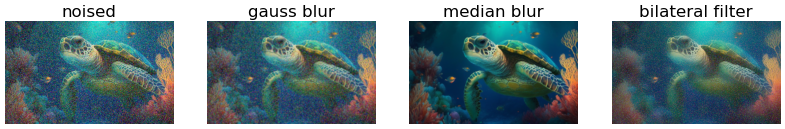

In [46]:
image = cv2.imread("image_1.png")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

var = 0.9
mean = 0

#gauss
gauss_noise = np.random.normal(mean,np.sqrt(var),image.shape).astype('uint8')
gauss = cv2.add(image,gauss_noise)


gauss_blur  = cv2.GaussianBlur(gauss, (5,5), 75)
median_blur = cv2.medianBlur(gauss, 5)
box_blur = cv2.boxFilter(gauss, -1, (5,5))
bilateral   = cv2.bilateralFilter(gauss,45,125,125)


plt.figure(figsize=(16,10))
plt.subplot(131); plt.imshow(gauss, cmap='gray'); plt.axis('off'); plt.title('noised', fontsize=24)
plt.subplot(133); plt.imshow(gauss_blur, cmap='gray'); plt.axis('off'); plt.title('gauss blur', fontsize=24)
# plt.subplot(223); plt.imshow(median_blur, cmap='gray'); plt.axis('off'); plt.title('median blur', fontsize=24)
plt.subplot(132); plt.imshow(box_blur, cmap='gray'); plt.axis('off'); plt.title('box blur', fontsize=24)
plt.show();

plt.figure(figsize=(16,10))
plt.subplot(131); plt.imshow(gauss, cmap='gray'); plt.axis('off'); plt.title('noised', fontsize=24)
plt.subplot(132); plt.imshow(gauss_blur, cmap='gray'); plt.axis('off'); plt.title('gauss blur', fontsize=24)
plt.subplot(133); plt.imshow(median_blur, cmap='gray'); plt.axis('off'); plt.title('median blur', fontsize=24)
# plt.subplot(132); plt.imshow(box_blur, cmap='gray'); plt.axis('off'); plt.title('box blur', fontsize=24)
plt.show();

plt.figure(figsize=(20,10))
plt.subplot(141); plt.imshow(gauss, cmap='gray'); plt.axis('off'); plt.title('noised', fontsize=24)
plt.subplot(142); plt.imshow(gauss_blur, cmap='gray'); plt.axis('off'); plt.title('gauss blur', fontsize=24)
plt.subplot(143); plt.imshow(median_blur, cmap='gray'); plt.axis('off'); plt.title('median blur', fontsize=24)
plt.subplot(144); plt.imshow(bilateral, cmap='gray'); plt.axis('off'); plt.title('bilateral filter', fontsize=24)
plt.show();

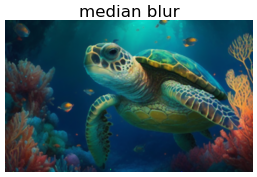

Text(0.5, 1.0, 'bilateral filter')

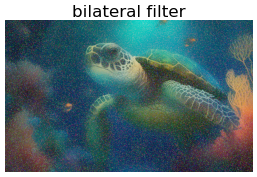

In [47]:
plt.imshow(median_blur, cmap='gray'); plt.axis('off'); plt.title('median blur', fontsize=24); plt.show()

bilateral   = cv2.bilateralFilter(gauss,45,125,125)
plt.imshow(bilateral, cmap='gray'); plt.axis('off'); plt.title('bilateral filter', fontsize=24)

485 793


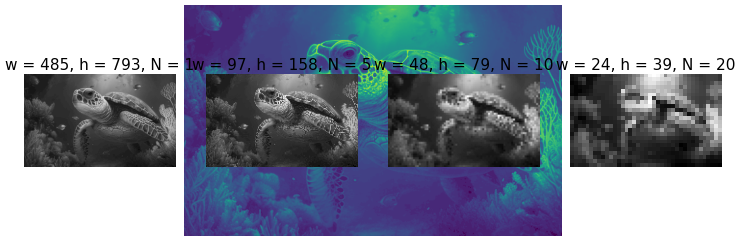

In [48]:
image = cv2.imread("image_1.png",cv2.IMREAD_GRAYSCALE)
(h, w) = image.shape
print(h,w)
plt.figure(figsize=(18,6));


plt.imshow(image);
plt.axis('off')


plt.subplot(1,4,1)

plt.imshow(image, 'gray')
plt.title('w = %d, h = %d, N = %d'%(image.shape[0],image.shape[1], 1), fontsize = 22); plt.axis('off')
plt.subplot(1,4,2)
image = cv2.resize(image,(w//5,h//5))
plt.imshow(image, 'gray')
plt.title('w = %d, h = %d, N = %d'%(image.shape[0],image.shape[1], 5), fontsize = 22); plt.axis('off')
plt.subplot(1,4,3)
image = cv2.resize(image,(w//10,h//10))
plt.imshow(image, 'gray')
plt.title('w = %d, h = %d, N = %d'%(image.shape[0],image.shape[1], 10), fontsize = 22); plt.axis('off')
plt.subplot(1,4,4)
image = cv2.resize(image,(w//20,h//20))
plt.imshow(image, 'gray')
plt.title('w = %d, h = %d, N = %d'%(image.shape[0],image.shape[1], 20), fontsize = 22); plt.axis('off')


plt.show();

485 793 3


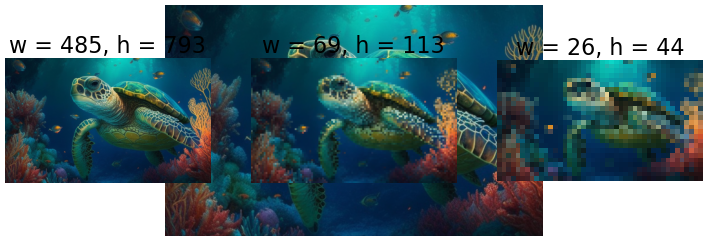

In [49]:
import cv2 as cv
image = cv.imread("image_1.png")
image = cv.cvtColor(image, cv.COLOR_BGR2RGB)
(h, w,c) = image.shape
print(h,w,c)
plt.figure(figsize=(18,6));


plt.imshow(image);
plt.axis('off')


plt.subplot(1,3,1)

plt.imshow(image)
plt.title('w = %d, h = %d'%(image.shape[0],image.shape[1]), fontsize = 32); plt.axis('off')
plt.subplot(1,3,2)
image = cv.resize(image,(w//7,h//7))
plt.imshow(image)
plt.title('w = %d, h = %d'%(image.shape[0],image.shape[1]), fontsize = 32); plt.axis('off')
plt.subplot(1,3,3)
image = cv.resize(image,(w//18,h//18))
plt.imshow(image)
plt.title('w = %d, h = %d'%(image.shape[0],image.shape[1]), fontsize = 32); plt.axis('off')

plt.show();

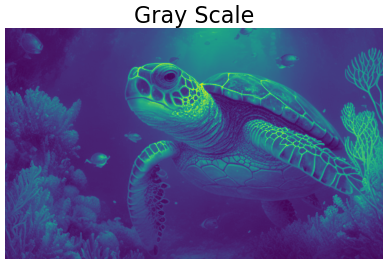

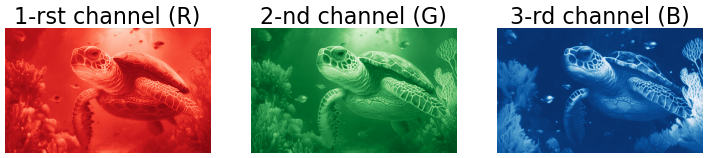

In [50]:
import cv2 as cv
image = cv.imread("image_1.png",)
image = cv.cvtColor(image, cv.COLOR_BGR2RGB)

plt.figure(figsize=(18,6));
image = cv.cvtColor(image, cv.COLOR_BGR2RGB)
plt.imshow(cv.cvtColor(image, cv.COLOR_BGR2GRAY));
plt.title('Gray Scale', fontsize = 32);
plt.axis('off');
plt.show();

plt.figure(figsize=(18,6));
plt.subplot(1,3,1)
plt.imshow(image[:,:,0],cmap="Reds_r")
plt.title('1-rst channel (R)', fontsize = 32); plt.axis('off')
plt.subplot(1,3,2)
plt.imshow(image[:,:,1],cmap="Greens_r")
plt.title('2-nd channel (G)', fontsize = 32); plt.axis('off')
plt.subplot(1,3,3)
plt.imshow(image[:,:,2],cmap="Blues_r")
plt.title('3-rd channel (B)', fontsize = 32); plt.axis('off')

plt.show();

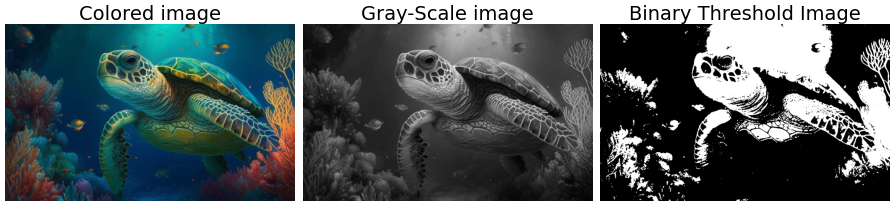

In [52]:
image = cv.imread("image_1.png",)
image = cv.cvtColor(image, cv.COLOR_BGR2RGB)

fig,axs = plt.subplots(1,3,figsize = (18,5))
axs[0].imshow(image); 
axs[0].set_title('Colored image', fontsize = 28); 
axs[0].axis('off');

axs[1].imshow(cv.cvtColor(image, cv.COLOR_BGR2GRAY), 'gray'); 
axs[1].set_title('Gray-Scale image', fontsize = 28); 
axs[1].axis('off');

image_gray = cv.imread("image_1.png",cv.IMREAD_GRAYSCALE)
ret_val,threshold = cv.threshold(image_gray, 70, 255, cv.THRESH_BINARY)
axs[2].imshow(threshold, 'gray'); 
axs[2].set_title('Binary Threshold Image', fontsize = 28); 
axs[2].axis('off');

plt.tight_layout();
plt.show();


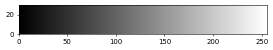

In [53]:
a = np.arange(256)
b = np.atleast_2d(np.repeat(a,3))
b = np.repeat(b,100,axis=0)
b.shape
plt.imshow(b, 'gray',extent=[0,255,0,30])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


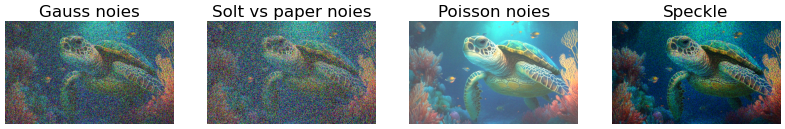

In [55]:
from skimage.util import random_noise


image = cv.imread("image_1.png",cv.IMREAD_COLOR)
image = cv.cvtColor(image, cv.COLOR_BGR2RGB)

s_and_p = random_noise(image, mode='s&p',salt_vs_pepper =0.5, amount = 0.5)
gauss   = random_noise(image, mode='gaussian',var = 0.3)
# poisson = random_noise(image, mode='poisson',clip =0.09)
poisson = image + np.random.poisson(70,image.shape) 
speckle = random_noise(image, mode='speckle',var = 0.7)

plt.figure(figsize=(20,12))
plt.subplot(141),plt.imshow(gauss);   plt.title('Gauss noies', fontsize = 24); plt.axis('off')
plt.subplot(142),plt.imshow(s_and_p); plt.title('Solt vs paper noies', fontsize = 24); plt.axis('off')
plt.subplot(143),plt.imshow(poisson); plt.title('Poisson noies', fontsize = 24); plt.axis('off')
plt.subplot(144),plt.imshow(speckle); plt.title('Speckle', fontsize = 24); plt.axis('off')
plt.show();

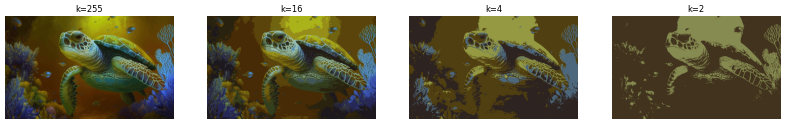

In [56]:
image = cv2.imread("image_1.png"); image = cv.cvtColor(image, cv.COLOR_BGR2RGB)
from sklearn.cluster import MiniBatchKMeans
k_ = 8
def requantatization(image, k_ = 8):
    (h, w) = image.shape[:2]
    # convert the image from the RGB color space to the L*a*b*
    # color space -- since we will be clustering using k-means
    # which is based on the euclidean distance, we'll use the
    # L*a*b* color space where the euclidean distance implies
    # perceptual meaning
    image = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    # reshape the image into a feature vector so that k-means
    # can be applied
    image = image.reshape((image.shape[0] * image.shape[1], 3))
    # apply k-means using the specified number of clusters and
    # then create the quantized image based on the predictions
    clt = MiniBatchKMeans(n_clusters = k_)
    labels = clt.fit_predict(image)
    quant = clt.cluster_centers_.astype("uint8")[labels]
    # reshape the feature vectors to images
    quant = quant.reshape((h, w, 3))
    image = image.reshape((h, w, 3))
    # convert from L*a*b* to RGB
    quant = cv2.cvtColor(quant, cv2.COLOR_LAB2BGR)
    image = cv2.cvtColor(image, cv2.COLOR_LAB2BGR)
    quant = cv.cvtColor(quant, cv.COLOR_BGR2RGB)
    return quant


fig, axs = plt.subplots(1,4,figsize = (20,4))

k_ = 255
axs[0].imshow(requantatization(image, k_ = k_), 'gray'); 
axs[0].set_title(f'k={k_}'); 
axs[0].axis('off')

k_ = 16
axs[1].imshow(requantatization(image, k_ = k_), 'gray'); 
axs[1].set_title(f'k={k_}'); 
axs[1].axis('off')

k_ = 4
axs[2].imshow(requantatization(image, k_ = k_), 'gray'); 
axs[2].set_title(f'k={k_}'); 
axs[2].axis('off')

k_ = 2
axs[3].imshow(requantatization(image, k_ = k_), 'gray'); 
axs[3].set_title(f'k={k_}'); 
axs[3].axis('off')

plt.show();

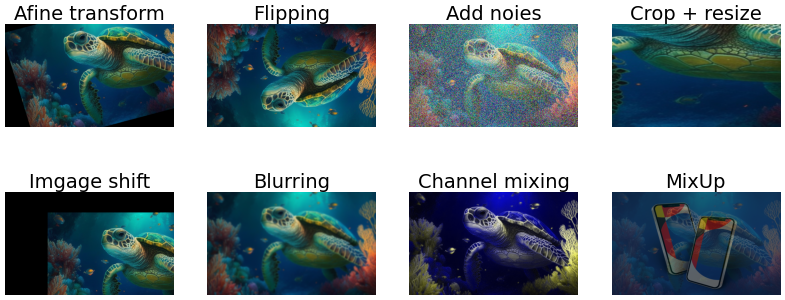

<Figure size 900x800 with 0 Axes>

In [58]:
fig, axs = plt.subplots(2,4, figsize =(20,8) )
title_font = 24
image = cv2.imread("image_1.png"); image = cv.cvtColor(image, cv.COLOR_BGR2RGB)

image = cv2.imread("image_1.png",cv2.IMREAD_COLOR)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(18,16))

w = image.shape[0]
h = image.shape[1]
center = (w // 2, h // 2)


def subplot(ax, image, title, fontsize = 28):
    ax.imshow(image); 
    ax.set_title(title, fontsize=fontsize); 
    ax.axis('off')
    

pts1 = np.float32([[10,50],[200,50],[50,200]])
pts2 = np.float32([[10,100],[200,50],[100,250]])
M = cv2.getAffineTransform(pts1,pts2)
afine = cv2.warpAffine(image,M,(h,w))
subplot(axs[0,0], afine, 'Afine transform')


flipped = cv2.flip(image, flipCode=0)
subplot(axs[0,1], flipped, 'Flipping')

var = 3; mean = 0
gauss_noise = np.random.normal(mean,np.sqrt(var),image.shape).astype('uint8')
gauss = cv2.add(image,gauss_noise)
subplot(axs[0,2], gauss, 'Add noies')

image_crop= np.copy(image)
w,h = image_crop.shape[:2]
image_crop = image_crop[200:(2*h)//3+200, w // 4+200:(3*w)//4+200,:]
image_crop = cv2.resize(image_crop,(h,w))
subplot(axs[0,3], image_crop, 'Crop + resize')

image_shift = np. copy(image)
image_shift[100:,200:,:] = image[:-100,:-200,:]
image_shift[:100,:,:] = 0
image_shift[:,:200,:] = 0
subplot(axs[1,0], image_shift, 'Imgage shift')

gausblur = cv2.GaussianBlur(image, (15, 15), 0)
subplot(axs[1,1], gausblur, 'Blurring')

image_chan_mix = np. copy(image)
image_chan_mix[:,:,2],image_chan_mix[:,:,1] = image_chan_mix[:,:,1],image_chan_mix[:,:,0]
subplot(axs[1,2], image_chan_mix, 'Channel mixing')


image2 = cv2.imread("image2.png",cv2.IMREAD_COLOR)
image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)
image2 = cv2.resize(image2, (image.shape[1],image.shape[0]))

mix = cv2.addWeighted(image,0.3,image2,0.4,0)
subplot(axs[1,3], mix, 'MixUp')

plt.tight_layout()
plt.show()

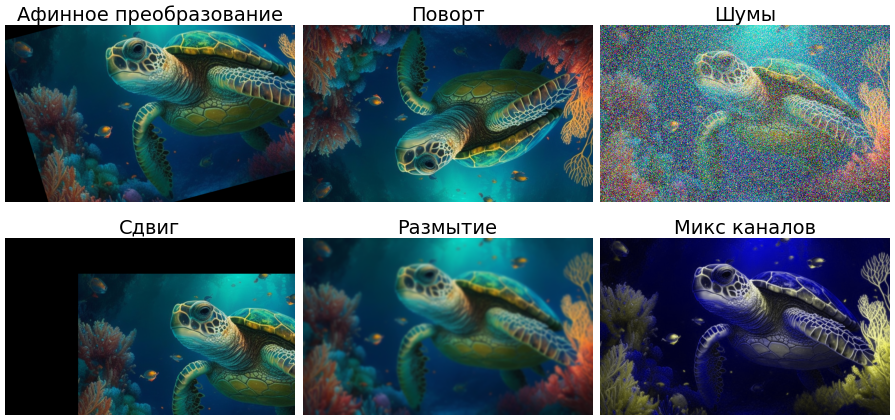

In [59]:
fig, axs = plt.subplots(2,3, figsize =(18,9) )
title_font = 24
image = cv2.imread("image_1.png"); image = cv.cvtColor(image, cv.COLOR_BGR2RGB)

w = image.shape[0]
h = image.shape[1]
center = (w // 2, h // 2)

def subplot(ax, image, title, fontsize = 28):
    ax.imshow(image); 
    ax.set_title(title, fontsize=fontsize); 
    ax.axis('off')
    

pts1 = np.float32([[10,50],[200,50],[50,200]])
pts2 = np.float32([[10,100],[200,50],[100,250]])
M = cv2.getAffineTransform(pts1,pts2)
afine = cv2.warpAffine(image,M,(h,w))


pts1 = np.float32([[10,50],[200,50],[50,200]])
pts2 = np.float32([[10,100],[200,50],[100,250]])
M = cv2.getAffineTransform(pts1,pts2)
afine = cv2.warpAffine(image,M,(h,w))

subplot(axs[0,0], afine, 'Афинное преобразование')


flipped = cv2.flip(image, flipCode=0)
subplot(axs[0,1], flipped, 'Поворт')

var = 3; mean = 0
gauss_noise = np.random.normal(mean,np.sqrt(var),image.shape).astype('uint8')
gauss = cv2.add(image,gauss_noise)
subplot(axs[0,2], gauss, 'Шумы')



image_shift = np. copy(image)
image_shift[100:,200:,:] = image[:-100,:-200,:]
image_shift[:100,:,:] = 0
image_shift[:,:200,:] = 0
subplot(axs[1,0], image_shift, 'Сдвиг')


gausblur = cv2.GaussianBlur(image, (15, 15), 0)
subplot(axs[1,1], gausblur, 'Размытие')

image_chan_mix = np. copy(image)
image_chan_mix[:,:,2],image_chan_mix[:,:,1] = image_chan_mix[:,:,1],image_chan_mix[:,:,0]
subplot(axs[1,2], image_chan_mix, 'Микс каналов')

plt.tight_layout()
plt.savefig('aug1.pdf', dpi=300)
plt.show()

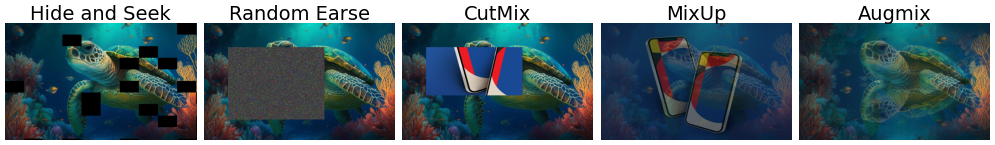

In [64]:
def subplot(ax, image, title, fontsize = 28):
    ax.imshow(image); 
    ax.set_title(title, fontsize=fontsize); 
    ax.axis('off')
    
    
image = cv2.imread("image_1.png",cv2.IMREAD_COLOR)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

fig, axs = plt.subplots(1,5, figsize =(20,12) )


image_h_and_s = np.copy(image)
w,h = image_h_and_s.shape[:2]
n_pathes = 10
w_path = w//n_pathes
h_path = h//n_pathes
n_hide = 20
w_hides = np.arange(0,w,w_path)
h_hides = np.arange(0,h,h_path)
w_hide  = np.random.choice(np.arange(0,w,w_path),size = n_hide)
h_hide  = np.random.choice(np.arange(0,h,h_path),size = n_hide)
for i in range(n_hide):
    image_h_and_s[w_hide[i]:w_hide[i]+w_path,h_hide[i]:h_hide[i]+h_path,:] = 0

subplot(axs[0], image_h_and_s, 'Hide and Seek')

image_Earse  = np.copy(image)
# earse_region = image_Earse[100:400,100:500,:]
mean = np.mean(image)
var = 1000
gauss_noise  = np.random.normal(mean,np.sqrt(var),(300,400,image.shape[2])).astype('uint8')

image_Earse[100:400,100:500,:] = gauss_noise

subplot(axs[1], image_Earse, 'Random Earse')


image_cutmix = np.copy(image)
image_cutmix[100:300,100:500,:] = image2[200:400,100:500,:]
subplot(axs[2], image_cutmix, 'CutMix')

image2 = cv2.imread("image2.png",cv2.IMREAD_COLOR)
image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)
image2 = cv2.resize(image2, (image.shape[1],image.shape[0]))

mix = cv2.addWeighted(image,0.3,image2,0.4,0)
subplot(axs[3], mix, 'MixUp')


ts1 = np.float32([[10,50],[200,50],[50,200]])
pts2 = np.float32([[10,100],[200,50],[100,250]])
M = cv2.getAffineTransform(pts1,pts2)
afine = cv2.warpAffine(image,M,(h,w))

# image_chan_mix = np. copy(image)
# image_chan_mix[:,:,2],image_chan_mix[:,:,1] = image_chan_mix[:,:,1],image_chan_mix[:,:,0]

image_shift = np. copy(image)
image_shift[100:,200:,:] = image[:-100,:-200,:]
image_shift[:100,:,:] = 0
image_shift[:,:200,:] = 0

image_Earse  = np.copy(image)
# earse_region = image_Earse[100:400,100:500,:]
mean = np.mean(image)
var = 1000
gauss_noise  = np.random.normal(mean,np.sqrt(var),(300,400,image.shape[2])).astype('uint8')
image_Earse[100:400,100:500,:] = gauss_noise

flipped = cv2.flip(image, flipCode=0)

augmix = cv2.addWeighted(afine,0.5,image_shift,0.5,0)
augmix = cv2.addWeighted(augmix, 0.5, image_Earse, 0.5,0)
augmix = cv2.addWeighted(augmix, 0.4, flipped, 0.6,0)
augmix = cv2.addWeighted(augmix, 0.5, image, 0.5,0)


subplot(axs[4], augmix, 'Augmix')

plt.tight_layout()
plt.show()


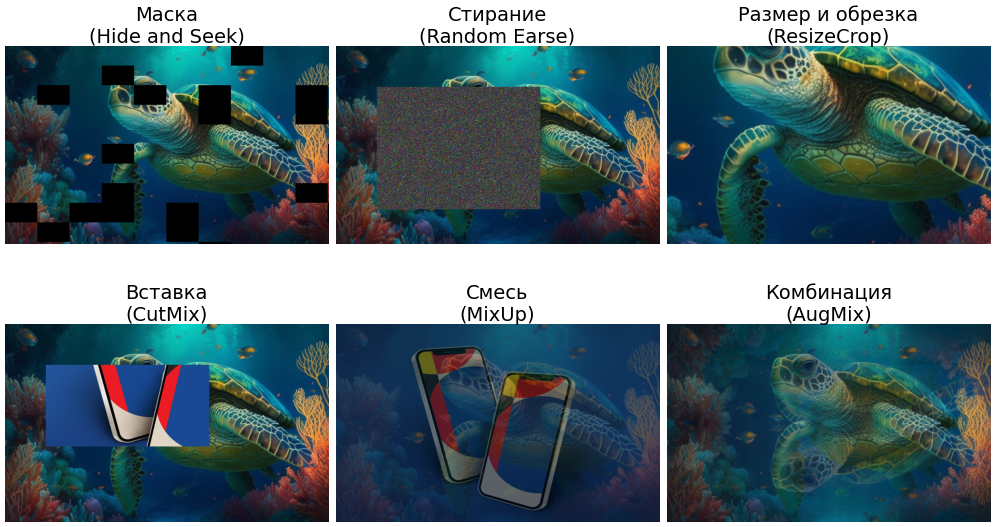

In [67]:
def subplot(ax, image, title, fontsize = 28):
    ax.imshow(image); 
    ax.set_title(title, fontsize=fontsize); 
    ax.axis('off')
    
    
image = cv2.imread("image_1.png",cv2.IMREAD_COLOR)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

fig, axs = plt.subplots(2,3, figsize =(20,12) )
axs = axs.ravel()

image_h_and_s = np.copy(image)
w,h = image_h_and_s.shape[:2]
n_pathes = 10
w_path = w//n_pathes
h_path = h//n_pathes
n_hide = 20
w_hides = np.arange(0,w,w_path)
h_hides = np.arange(0,h,h_path)
w_hide  = np.random.choice(np.arange(0,w,w_path),size = n_hide)
h_hide  = np.random.choice(np.arange(0,h,h_path),size = n_hide)
for i in range(n_hide):
    image_h_and_s[w_hide[i]:w_hide[i]+w_path,h_hide[i]:h_hide[i]+h_path,:] = 0

subplot(axs[0], image_h_and_s, 'Маска\n(Hide and Seek)')

image_Earse  = np.copy(image)
# earse_region = image_Earse[100:400,100:500,:]
mean = np.mean(image)
var = 1000
gauss_noise  = np.random.normal(mean,np.sqrt(var),(300,400,image.shape[2])).astype('uint8')

image_Earse[100:400,100:500,:] = gauss_noise

subplot(axs[1], image_Earse, 'Стирание\n(Random Earse)')


image_crop= np.copy(image)
w,h = image_crop.shape[:2]
image_crop = cv2.resize(image_crop,(int(1.5*h),int(1.5*w)))
image_crop = image_crop[w // 3:w//3+w,h//3:h//3+h,:]

subplot(axs[2], image_crop, 'Размер и обрезка\n(ResizeCrop)')


image_cutmix = np.copy(image)
image_cutmix[100:300,100:500,:] = image2[200:400,100:500,:]
subplot(axs[3], image_cutmix, 'Вставка\n(CutMix)')

image2 = cv2.imread("image2.png",cv2.IMREAD_COLOR)
image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)
image2 = cv2.resize(image2, (image.shape[1],image.shape[0]))

mix = cv2.addWeighted(image,0.3,image2,0.4,0)
subplot(axs[4], mix, 'Смесь\n(MixUp)')


ts1 = np.float32([[10,50],[200,50],[50,200]])
pts2 = np.float32([[10,100],[200,50],[100,250]])
M = cv2.getAffineTransform(pts1,pts2)
afine = cv2.warpAffine(image,M,(h,w))

# image_chan_mix = np. copy(image)
# image_chan_mix[:,:,2],image_chan_mix[:,:,1] = image_chan_mix[:,:,1],image_chan_mix[:,:,0]

image_shift = np. copy(image)
image_shift[100:,200:,:] = image[:-100,:-200,:]
image_shift[:100,:,:] = 0
image_shift[:,:200,:] = 0

image_Earse  = np.copy(image)
# earse_region = image_Earse[100:400,100:500,:]
mean = np.mean(image)
var = 1000
gauss_noise  = np.random.normal(mean,np.sqrt(var),(300,400,image.shape[2])).astype('uint8')
image_Earse[100:400,100:500,:] = gauss_noise

flipped = cv2.flip(image, flipCode=0)

augmix = cv2.addWeighted(afine,0.5,image_shift,0.5,0)
augmix = cv2.addWeighted(augmix, 0.5, image_Earse, 0.5,0)
augmix = cv2.addWeighted(augmix, 0.4, flipped, 0.6,0)
augmix = cv2.addWeighted(augmix, 0.5, image, 0.5,0)


subplot(axs[5], augmix, 'Комбинация\n(AugMix)')

plt.tight_layout()
plt.savefig('aug2.pdf', dpi=300)
plt.show()


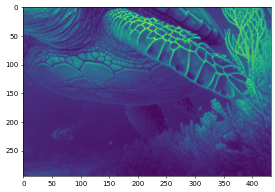

In [68]:
image = cv2.imread("image_1.png"); image = cv.cvtColor(image, cv.COLOR_BGR2GRAY)

image.shape
imcut = image[190:490,360:970]

plt.imshow(imcut)


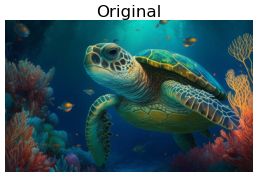

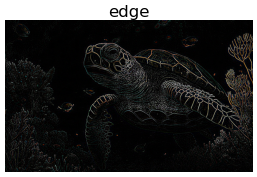

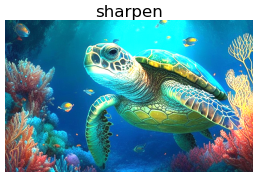

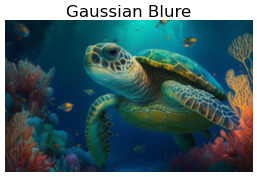

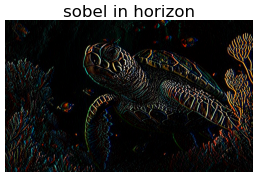

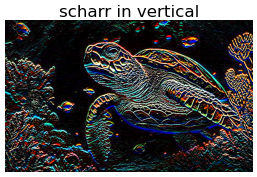

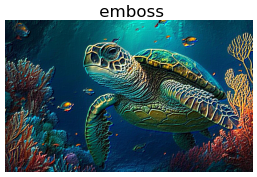

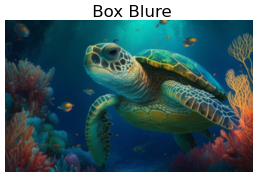

In [70]:
image = cv2.imread("image_1.png",cv2.IMREAD_COLOR)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

#Edge detection
kernel = np.array([[-1, -1,  -1],
                   [-1,  8,  -1],
                   [-1, -1,  -1]])
edge  = cv2.filter2D(src=image,  ddepth=-1, kernel=kernel)


#Sharpen
kernel = np.array([[ 0, -1,   0],
                   [-1,  6,  -1],
                   [ 0, -1,   0]])
sharpen  = cv2.filter2D(src=image,  ddepth=-1, kernel=kernel)

#Gaussian Blure
kernel = [[2, 4, 5, 4, 2],
          [4, 9, 12,9, 4],
          [5, 12,15,12,5],
          [4, 9, 12, 9,4],
          [2, 4, 5, 4, 2]]
kernel = np.asarray(kernel)/np.sum(kernel)
gaussian_blure  = cv2.filter2D(src=image,  ddepth=-1, kernel=kernel)

#Sobel edge detection in horizon 
kernel = np.array([[-1, 0,  1],
                   [-2, 0,  2],
                   [-1, 0,  1]])
sobelx  = cv2.filter2D(src=image,  ddepth=-1, kernel=kernel)

#Scharr edge detection in vertical 
kernel = np.array([[-3, -10, -3],
                   [ 0,  0,  0],
                   [ 3,  10,  3]])
scharry  = cv2.filter2D(src=image,  ddepth=-1, kernel=kernel)

#  emboss filter
kernel = np.array([[-2, -1, 0],
                   [-1,  1, 1],
                   [ 0,  1, 2]])
kernel = np.asarray(kernel)/np.sum(kernel)
emboss  = cv2.filter2D(src=image,  ddepth=-1, kernel=kernel)

#Edge detection
kernel = np.array([[1, 1,  1],
                   [1, 1,  1],
                   [1, 1,  1]])/9

boxblur  = cv2.filter2D(src=image,  ddepth=-1, kernel=kernel)

# plt.figure(figsize=(18,18))
plt.imshow(image, 'gray'); plt.title("Original", fontsize = 24); plt.axis('off');plt.show()
plt.imshow(edge, 'gray'); plt.title("edge", fontsize = 24); plt.axis('off');plt.show()
plt.imshow(sharpen, 'gray'); plt.title("sharpen", fontsize = 24); plt.axis('off');plt.show()
plt.imshow(gaussian_blure, 'gray'); plt.title("Gaussian Blure", fontsize = 24); plt.axis('off');plt.show()
plt.imshow(sobelx, 'gray'); plt.title("sobel in horizon", fontsize = 24); plt.axis('off');plt.show()
plt.imshow(scharry, 'gray'); plt.title("scharr in vertical", fontsize = 24); plt.axis('off');plt.show()
plt.imshow(emboss, 'gray');plt.title(" emboss", fontsize = 24); plt.axis('off');plt.show()
plt.imshow(boxblur, 'gray');plt.title(" Box Blure", fontsize = 24); plt.axis('off');plt.show()

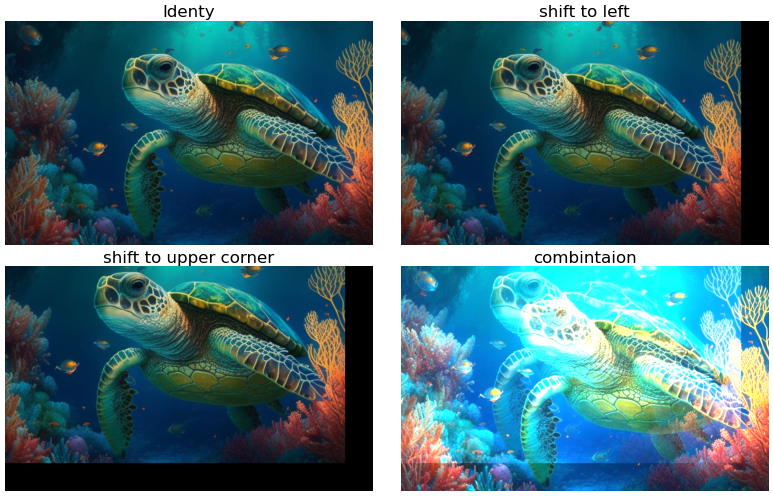

In [72]:
image      = cv2.imread("image_1.png",cv2.IMREAD_COLOR)
image_rgb  = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

kernel = np.zeros((9,9))
kernel[5,5] = 1
identy  = cv2.filter2D(src=image_rgb,  ddepth=-1, kernel=kernel)

size = 121
kernel = np.zeros((size,size))
kernel[size//2,size-1] = 1
# print(kernel)
shift  = cv2.filter2D(src=image_rgb,  ddepth=-1, kernel=kernel, borderType = cv2.BORDER_CONSTANT )

size = 121
kernel = np.zeros((size,size))
kernel[size-1,size-1] = 1
# print(kernel)
shift2  = cv2.filter2D(src=image_rgb,  ddepth=-1, kernel=kernel, borderType = cv2.BORDER_CONSTANT)

size = 121
kernel = np.zeros((size,size))
kernel[size-1,size-1] = 1
kernel[size//2,size//2] = 2
# kernel[0,0] = 1
# print(kernel)
shift3  = cv2.filter2D(src=image_rgb,  ddepth=-1, kernel=kernel, borderType = cv2.BORDER_CONSTANT)



size = 121
kernel = np.diag((size,size))


shift4  = cv2.filter2D(src=image_rgb,  ddepth=-1, kernel=kernel, borderType = cv2.BORDER_CONSTANT)
shift4 =shift4.astype(float)/shift4.astype(float).max()

plt.figure(figsize=(16,10))
plt.subplot(221); plt.imshow(image_rgb); plt.title('Identy', fontsize =24); plt.axis('off')
# plt.subplot(131); plt.imshow(identy); plt.axis('off'); plt.title('Identy', fontsize =24)
plt.subplot(222); plt.imshow(shift); plt.axis('off'); plt.title('shift to left', fontsize =24)
plt.subplot(223); plt.imshow(shift2); plt.axis('off'); plt.title('shift to upper corner', fontsize =24)
plt.subplot(224); plt.imshow(shift3); plt.axis('off'); plt.title('combintaion', fontsize =24)
plt.tight_layout();plt.show();



<>:11: SyntaxWarning: invalid escape sequence '\s'
<>:11: SyntaxWarning: invalid escape sequence '\s'
C:\Users\Ronkin\AppData\Local\Temp\ipykernel_8836\1830407325.py:11: SyntaxWarning: invalid escape sequence '\s'
  axplot(blurred, axs[1], 'Gaussian blur ksize=9, $\sigma$=30', fontsize = 24 )


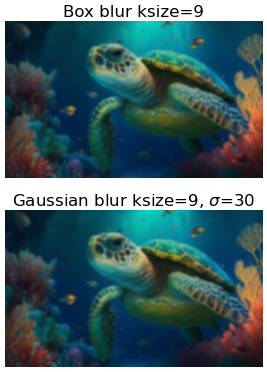

In [73]:
image = cv2.imread("image_1.png",cv2.IMREAD_COLOR)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
fig, axs = plt.subplots(2,1, figsize=(18,9))

#1. BOX BLURRING 
blurred = cv2.boxFilter(image, -1, (9,9))
axplot(blurred, axs[0], 'Box blur ksize=9' )

#2. Gaussian BLURRING 
blurred = cv2.GaussianBlur(image, (9, 9), 30)
axplot(blurred, axs[1], 'Gaussian blur ksize=9, $\sigma$=30', fontsize = 24 )


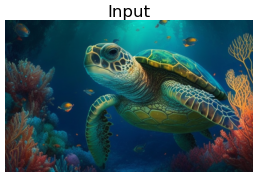

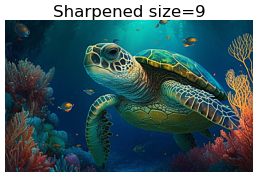

[[-0.01234568 -0.01234568 -0.01234568 -0.01234568 -0.01234568 -0.01234568
  -0.01234568 -0.01234568 -0.01234568]
 [-0.01234568 -0.01234568 -0.01234568 -0.01234568 -0.01234568 -0.01234568
  -0.01234568 -0.01234568 -0.01234568]
 [-0.01234568 -0.01234568 -0.01234568 -0.01234568 -0.01234568 -0.01234568
  -0.01234568 -0.01234568 -0.01234568]
 [-0.01234568 -0.01234568 -0.01234568 -0.01234568 -0.01234568 -0.01234568
  -0.01234568 -0.01234568 -0.01234568]
 [-0.01234568 -0.01234568 -0.01234568 -0.01234568  1.98765432 -0.01234568
  -0.01234568 -0.01234568 -0.01234568]
 [-0.01234568 -0.01234568 -0.01234568 -0.01234568 -0.01234568 -0.01234568
  -0.01234568 -0.01234568 -0.01234568]
 [-0.01234568 -0.01234568 -0.01234568 -0.01234568 -0.01234568 -0.01234568
  -0.01234568 -0.01234568 -0.01234568]
 [-0.01234568 -0.01234568 -0.01234568 -0.01234568 -0.01234568 -0.01234568
  -0.01234568 -0.01234568 -0.01234568]
 [-0.01234568 -0.01234568 -0.01234568 -0.01234568 -0.01234568 -0.01234568
  -0.01234568 -0.01234

In [75]:
def onesf(size = 3):
    return np.ones(size**2).reshape(size,size)/size**2
def gkernel(l=3, sig=2):
    """\
    Gaussian Kernel Creator via given length and sigma
    """

    ax = np.linspace(-(l - 1) / 2., (l - 1) / 2., l)
    xx, yy = np.meshgrid(ax, ax)

    kernel = np.exp(-0.5 * (np.square(xx) + np.square(yy)) / np.square(sig))

    return kernel / np.sum(kernel)
def sharpen(size = 5, amount = None, gauss = False):
    orignial = np.zeros((size,size))
    orignial[size//2,size//2] = 1

    if gauss:
        blur = gkernel(l=size, sig=size*3)
    else:
        blur = onesf(size = size)
    
    if not amount:
        amount = np.sum(blur)
    kernel = orignial + (orignial - blur)*amount
    return kernel #/np.sum(kernel)


image = cv2.imread("image_1.png",cv2.IMREAD_COLOR)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

kernel = sharpen(9)

output =cv2.filter2D(image,-1, kernel)


plt.imshow(image); plt.title('Input', fontsize = 24); plt.axis('off'); plt.show()
# plt.imshow( output,cmap='gray'); plt.axis('off'); plt.title('Sharpened size=9', fontsize = 24); plt.show()
# kernel = sharpen(9, gauss = True)

output =cv2.filter2D(image,-1, kernel)
plt.imshow( output,cmap='gray'); plt.axis('off'); plt.title('Sharpened size=9', fontsize = 24); plt.show()
print(kernel)

In [ ]:
#Sobel edge detection in horizon 
kernel = np.array([[-1, 0,  1],
                   [-2, 0,  2],
                   [-1, 0,  1]])
sobelx  = cv2.filter2D(src=image,  ddepth=-1, kernel=kernel)


kernel = np.array([[-1, -2,  -1],
                   [ 0,  0,   0],
                   [ 1,  2,   1]])

sobely  = cv2.filter2D(src=image,  ddepth=-1, kernel=kernel)
# ret,sobelx = cv2.threshold(sobelx,127,255,cv2.THRESH_BINARY)

plt.imshow(image); plt.title('Input', fontsize = 24); plt.axis('off'); plt.show()
plt.imshow( sobelx.astype(int),cmap='gray'); plt.axis('off'); plt.title('Sobel Horizon (Gx)', fontsize = 24); plt.show()
plt.imshow( sobely,cmap='gray'); plt.axis('off'); plt.title('Sobel Vertical (Gy)', fontsize = 24); plt.show()

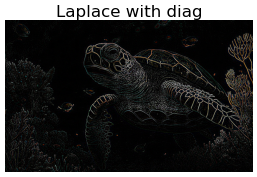

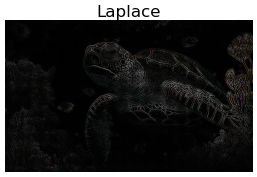

In [76]:
image = cv2.imread("image_1.png",cv2.IMREAD_COLOR)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

#Edge detection
kernel = np.array([[-1, -1,  -1],
                   [-1,  8,  -1],
                   [-1, -1,  -1]])
edge  = cv2.filter2D(src=image,  ddepth=-1, kernel=kernel)


#Edge detection
kernel = -2*np.array([[0, -1,  0],
                   [-1,  4,  -1],
                   [0, -1,  0]])

edge2  = cv2.filter2D(src=image,  ddepth=-1, kernel=kernel)
edge2  = edge2.astype(float)/edge2.astype(float).max()
#Sharpen
kernel = np.array([[ -1, -1,   -1],
                   [-1,  5,  -1],
                   [ -1, -1,   -1]])
kernel = np.asarray(kernel)/np.sum(kernel)
sharpen  = cv2.filter2D(src=image,  ddepth=-1, kernel=kernel)

#Gaussian Blure
kernel = [[2, 4, 5, 4, 2],
          [4, 9, 12,9, 4],
          [5, 12,15,12,5],
          [4, 9, 12, 9,4],
          [2, 4, 5, 4, 2]]
kernel = np.asarray(kernel)/np.sum(kernel)
gaussian_blure  = cv2.filter2D(src=image,  ddepth=-1, kernel=kernel)

#Sobel edge detection in horizon 
kernel = np.array([[-1, 0,  1],
                   [-2, 0,  2],
                   [-1, 0,  1]])
sobelx  = cv2.filter2D(src=image,  ddepth=-1, kernel=kernel)

#Scharr edge detection in vertical 
kernel = np.array([[-3, -10, -3],
                   [ 0,  0,  0],
                   [ 3,  10,  3]])
scharry  = cv2.filter2D(src=image,  ddepth=-1, kernel=kernel)

#  emboss filter
kernel = np.array([[-2, -1, 0],
                   [-1,  1, 1],
                   [ 0,  1, 2]])

kernel = np.asarray(kernel)/np.sum(kernel)
emboss  = cv2.filter2D(src=image,  ddepth=-1, kernel=kernel)


# plt.figure(figsize=(18,18))
plt.imshow(edge, 'gray'); plt.title("Laplace with diag", fontsize = 24); plt.axis('off');plt.show()
plt.imshow(edge2, 'gray'); plt.title("Laplace", fontsize = 24); plt.axis('off');plt.show()


# plt.imshow(sharpen, 'gray'); plt.title("sharpen"); plt.axis('off');plt.show()
# plt.imshow(gaussian_blure, 'gray'); plt.title("gaussian_blure"); plt.axis('off');plt.show()
# plt.imshow(sobelx, 'gray'); plt.title("sobel in horizon"); plt.axis('off');plt.show()
# plt.imshow(scharry, 'gray'); plt.title("scharr in vertical"); plt.axis('off');plt.show()
# plt.imshow(emboss, 'gray');plt.title(" emboss"); plt.axis('off');plt.show()



# CV FE

In [110]:
from skimage import feature
def plt_feature(image, name = '', rescale =(0, 23), fontsize = 34 ):
    if rescale:
        image = exposure.rescale_intensity(image, 
                                           in_range=rescale)
    plt.figure(figsize=(14,14)); 
    plt.imshow(image, 'gray'); 
    plt.title(name, fontsize = fontsize);
    plt.axis('off')
    plt.show()

In [77]:
image  = imread('image_1.png', as_gray=False)

fd, hog_image = feature.hog(image, 
                            pixels_per_cell=(20, 20), 
                            visualize=True)

plt_feature(hog_image,'HOG')

ValueError: Only images with two spatial dimensions are supported. If using with color/multichannel images, specify `channel_axis`.

In [ ]:
from skimage import color
image  = imread('image_1.png', as_gray=False)

labels = segmentation.slic(image, compactness=50, n_segments=120, start_label=1, sigma=0.5)
RAG    = color.label2rgb(labels, image, kind='avg', bg_label=0)

RAG = np.asarray(RAG, dtype='uint8')

plt.figure(figsize=(14,14))
plt.imshow(RAG);
plt.title('RAG Segmentation', fontsize = 34)
plt.axis('off')
plt.show()

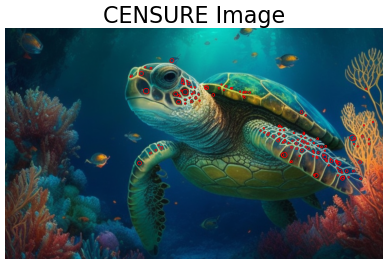

In [78]:
from skimage import data
from skimage import transform
from skimage.feature import CENSURE
from skimage.color import rgb2gray

import matplotlib.pyplot as plt

image = cv2.imread('image_1.png',cv2.IMREAD_COLOR)
image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
img_orig = rgb2gray(image)
tform = transform.AffineTransform(scale=(1.5, 1.5), rotation=0.5,
                                  translation=(150, -200))
img_warp = transform.warp(img_orig, tform)

detector = CENSURE()

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(12, 6))

detector.detect(img_orig)

ax.imshow(image, cmap=plt.cm.gray)
ax.scatter(detector.keypoints[:, 1], detector.keypoints[:, 0],
              2 ** detector.scales, facecolors='none', edgecolors='r')
ax.set_title("CENSURE Image", fontsize = 32)
ax.axis('off')
plt.show()

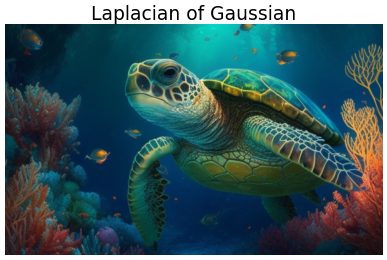

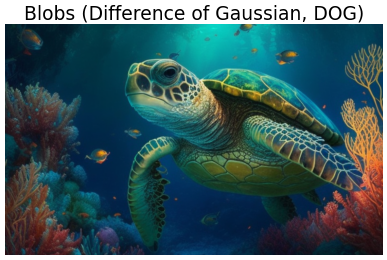

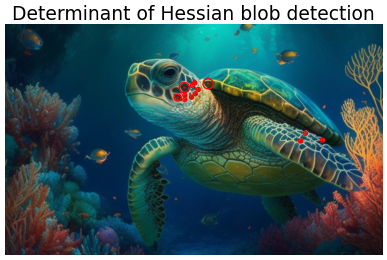

<Figure size 320x240 with 0 Axes>

In [109]:
import cv2
from math import sqrt
from skimage import data
from skimage.feature import blob_dog, blob_log, blob_doh
from skimage.color import rgb2gray

import matplotlib.pyplot as plt

image_rgb = cv2.imread('image_1.png',cv2.IMREAD_COLOR)
image_rgb = cv2.cvtColor(image_rgb, cv2.COLOR_BGR2RGB)
image = cv2.imread('image_1.png',cv2.IMREAD_GRAYSCALE)
image_gray = rgb2gray(image_rgb)

blobs_log = blob_log(image_gray, max_sigma=30, num_sigma=10, threshold=1)

# Compute radii in the 3rd column.
blobs_log[:, 2] = blobs_log[:, 2] * sqrt(2)

blobs_dog = blob_dog(image_gray, max_sigma=30, threshold=1)
blobs_dog[:, 2] = blobs_dog[:, 2] * sqrt(2)

blobs_doh = blob_doh(image_gray, max_sigma=30, threshold=.0071)

blobs_list = [blobs_log, blobs_dog, blobs_doh]
colors = ['yellow', 'lime', 'red']
titles = ['Laplacian of Gaussian', 'Blobs (Difference of Gaussian, DOG)',
          'Determinant of Hessian blob detection']
sequence = zip(blobs_list, colors, titles)

# fig, axes = plt.subplots(3, 1, figsize=(22, 16), sharex=True, sharey=True)


for idx, (blobs, color, title) in enumerate(sequence):
    fig, ax = plt.subplots(1, 1, figsize = (12,6))

    ax.set_title(title, fontsize = 27)
    ax.imshow(image_rgb)
    for blob in blobs:
        y, x, r = blob
        c = plt.Circle((x, y), r, color='red', linewidth=2, fill=False)
        ax.add_patch(c)
        c = plt.Circle((x, y), 1, color='red', linewidth=2, fill=False)
        ax.add_patch(c)
    ax.set_axis_off()
    plt.show()
plt.tight_layout()
plt.show()

(485, 793)


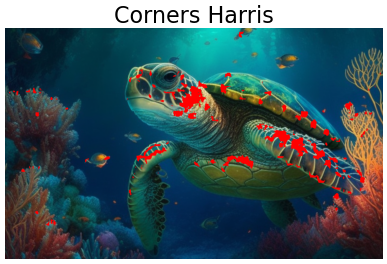

In [80]:
import cv2
import numpy as np

image = cv2.imread('image_1.png',cv2.IMREAD_COLOR)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
img = image.copy()
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

gray = np.float32(gray)
dst = cv2.cornerHarris(gray,12,9,0.2)
print(dst.shape)
#result is dilated for marking the corners, not important


# Threshold for an optimal value, it may vary depending on the image.
img[dst>0.01*dst.max()]=[255,0,0]
# img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
plt.figure(figsize = (12,6))
plt.imshow(img, 'gray'); plt.axis('off'); plt.title('Corners Harris', fontsize =32); plt.show()



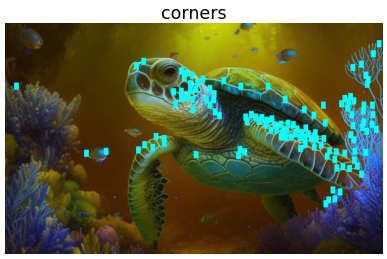

array([[623, 233],
       [389, 130],
       [619, 243],
       [579, 242],
       [550, 207],
       [669, 245],
       [400, 142],
       [459, 123],
       [579, 215],
       [582, 232],
       [389, 145],
       [653, 246],
       [610, 235],
       [547, 217],
       [643, 245],
       [415, 120],
       [495, 135],
       [630, 257],
       [591, 226],
       [589, 242],
       [629, 243],
       [317, 241],
       [605, 216],
       [570, 227],
       [380, 108],
       [376, 118],
       [713, 161],
       [370, 103],
       [291,  83],
       [688, 353],
       [380, 158],
       [725, 157],
       [526, 200],
       [539, 201],
       [728, 195],
       [334, 245],
       [676, 282],
       [663, 259],
       [560, 204],
       [709, 304],
       [280, 269],
       [503, 273],
       [649, 263],
       [726, 237],
       [636, 235],
       [594, 213],
       [631, 223],
       [628, 184],
       [753, 210],
       [600, 242],
       [552, 135],
       [558, 228],
       [370,

In [81]:
import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt

plt.figure(figsize = (12,6))
img = cv.imread('image_1.png')

gray = cv.cvtColor(img,cv.COLOR_BGR2GRAY)
corners = cv.goodFeaturesToTrack(gray,125,0.01,10).astype(int)

# corners = np.int0(corners)
for i in corners:
    x,y = i.ravel()
    img[y-10:y+5,x-5:x+5,:] = [0,255,255]
#     cv.circle(img,(x,y),3,255,-1)


plt.imshow(img, 'gray'); plt.axis('off'); plt.title('corners', fontsize = 25); plt.show()
np.squeeze(corners)

C:\Users\Ronkin\AppData\Local\Temp\ipykernel_8836\1175378799.py:21: FutureWarning: `plot_matches` is deprecated since version 0.23 and will be removed in version 0.25. Use `skimage.feature.plot_matched_features` instead.
  feature.plot_matches(ax, image1, image2, keypoints1, keypoints2, matches12);


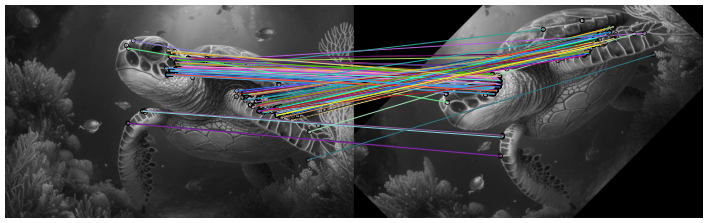

In [82]:
image1 = imread('image_1.png', as_gray=True)

image2 = transform.rotate(image1, 45) # distorted image

descr = feature.ORB(n_keypoints=200) #descriptor_extractor

# original image features
descr.detect_and_extract(image1)
keypoints1 = descr.keypoints
descr1     = descr.descriptors

# distorted image features
descr.detect_and_extract(image2)
keypoints2 = descr.keypoints
descr2     = descr.descriptors

# matches features 
matches12 = feature.match_descriptors(descr1, descr2, cross_check=True)

fig, ax = plt.subplots(figsize=(18,10)); 
feature.plot_matches(ax, image1, image2, keypoints1, keypoints2, matches12);  
plt.gray(); plt.axis('off'); plt.show()

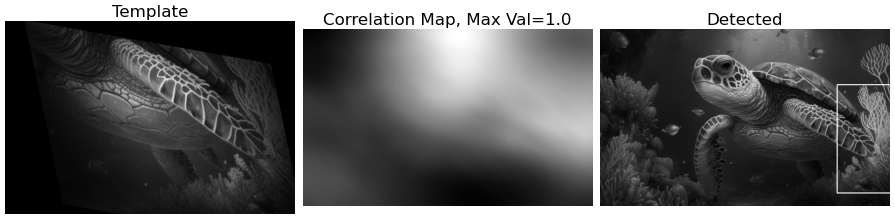

In [83]:
image = cv2.imread("image_1.png",cv2.IMREAD_COLOR)
image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
template = np.copy(image[190:490,350:950])
template = afine_transform(vignette(template,0.1)) 
h, w = template.shape[:2]

res = cv2.filter2D(image.astype(float), ddepth=-1, kernel = template[:,:].astype(float))
min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
top_left = max_loc[0] + w//2, max_loc[1]+h//2

# res = cv2.matchTemplate(image,template,method=cv2.TM_CCOEFF)
# min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
# top_left = max_loc[0], max_loc[1]

max_val /=np.sum(max_val)

bottom_right = (top_left[0] + w, top_left[1] + h)
cv2.rectangle(image, top_left, bottom_right, 255, 2)

fig, axs = plt.subplots(1,3, figsize=(18,18))
axplot(res, axs[1], f'Correlation Map, Max Val={max_val:.1f}' )
axplot(template, axs[0], 'Template' )
axplot(image, axs[2], 'Detected', finish=True  ) 


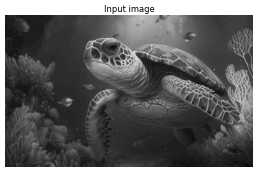

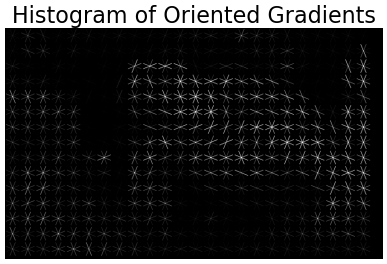

In [84]:
import matplotlib.pyplot as plt

from skimage.feature import hog
from skimage import data, exposure


image = cv2.imread('image_1.png',cv2.IMREAD_GRAYSCALE)

fd, hog_image = hog(image, orientations=4, pixels_per_cell=(32, 32),
                    cells_per_block=(1,1), feature_vector=False, visualize=True)

fig, ax = plt.subplots(1, 1, sharex=True, sharey=True)

ax.axis('off')
ax.imshow(image, cmap=plt.cm.gray)
ax.set_title('Input image')
plt.show()

# Rescale histogram for better display
hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))
fig, ax = plt.subplots(1, 1,  sharex=True, sharey=True, figsize = (12,6))
ax.axis('off')
ax.imshow(hog_image_rescaled, cmap=plt.cm.gray)
ax.set_title('Histogram of Oriented Gradients', fontsize = 32)
plt.show()

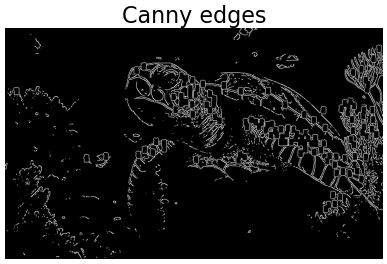

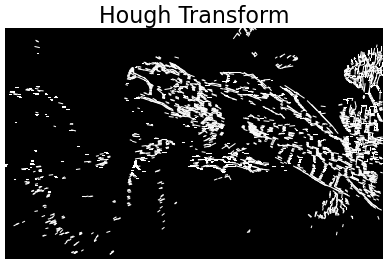

In [87]:
import numpy as np

from skimage.transform import hough_line, hough_line_peaks
from skimage.feature import canny
from skimage.draw import line
from skimage import data

import matplotlib.pyplot as plt
from matplotlib import cm
from skimage.transform import probabilistic_hough_line

# Line finding using the Probabilistic Hough Transform
image = cv2.imread('image_1.png',cv2.IMREAD_GRAYSCALE)
edges = cv.Canny(img,210,220)
lines = probabilistic_hough_line(edges, threshold=30, line_length=3,
                                 line_gap=3)

# Generating figure 2



fig, ax = plt.subplots(1, 1
                       , figsize=(12, 6), sharex=True, sharey=True)
ax.imshow(edges, cmap=cm.gray)
ax.set_title('Canny edges', fontsize = 32)
ax.set_axis_off()
plt.show()

fig, ax = plt.subplots(1, 1
                       , figsize=(12, 6), sharex=True, sharey=True)
ax.imshow(edges * 0, cmap = 'gray')

for line in lines:
    p0, p1 = line
    ax.plot((p0[0], p1[0]), (p0[1], p1[1]), c='white')
ax.set_xlim((0, image.shape[1]))
ax.set_ylim((image.shape[0], 0))
ax.set_title('Hough Transform', fontsize = 32 )
ax.set_axis_off()


plt.show()

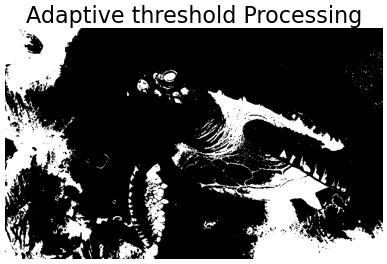

In [88]:

fig, ax = plt.subplots(1, 1
                       , figsize=(12, 6), sharex=True, sharey=True)

img = cv2.cvtColor(cv2.imread("image_1.png"),
                   cv2.COLOR_BGR2HSV)
img = img[:,:,2].copy()
image = cv2.cvtColor(cv2.imread("image_1.png"),
                   cv2.COLOR_BGR2GRAY)

image1 = np.copy(image)

threahold = 59

# image[img>=threahold] = 255
image[img<threahold] = 0
out = image1-image
out[out>1] = 255
plt.title('Adaptive threshold Processing', fontsize = 32)
plt.imshow(out, cmap = 'gray')
plt.axis('off')
plt.show()

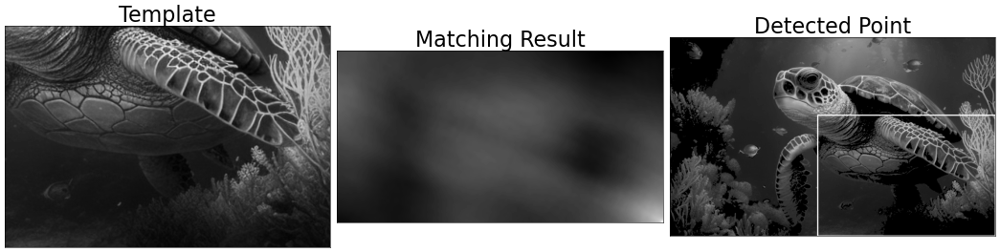

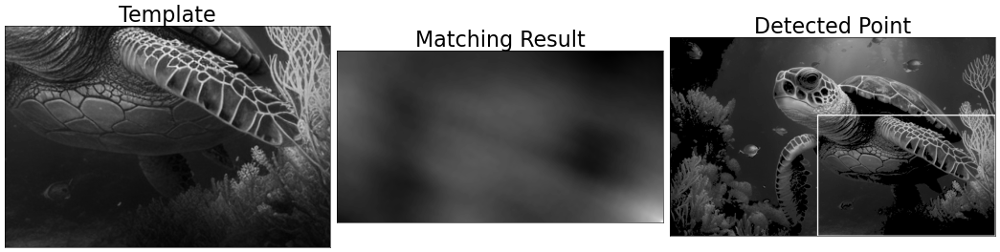

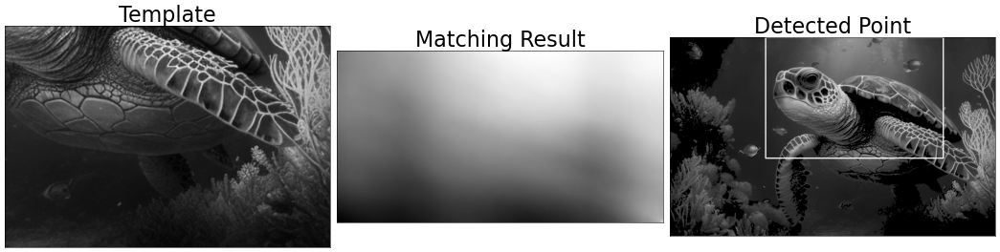

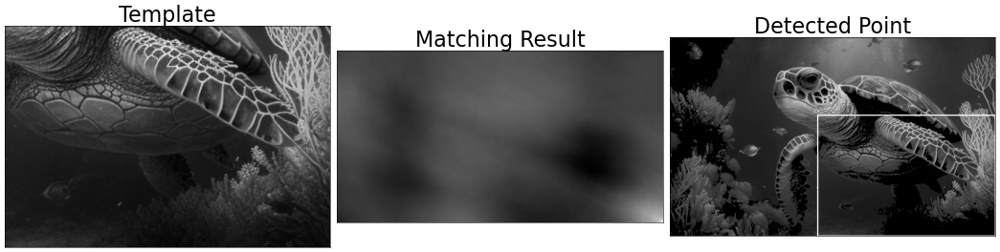

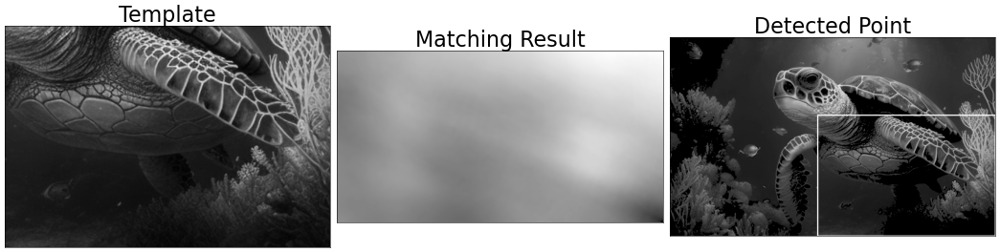

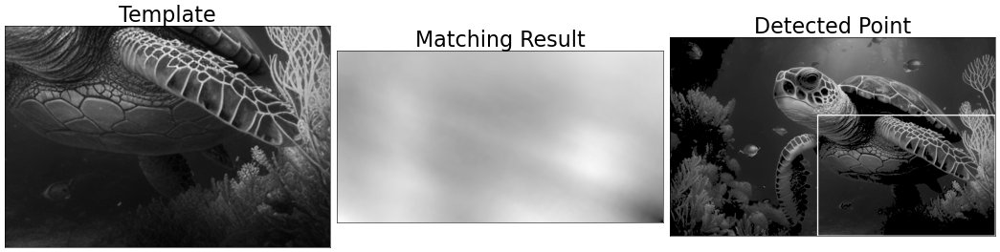

In [89]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt
img = image
img2 = img.copy()
template = imcut
w, h = template.shape[::-1]
# All the 6 methods for comparison in a list
methods = ['cv.TM_CCOEFF', 'cv.TM_CCOEFF_NORMED', 'cv.TM_CCORR',
            'cv.TM_CCORR_NORMED', 'cv.TM_SQDIFF', 'cv.TM_SQDIFF_NORMED']
for meth in methods:
    img = img2.copy()
    method = eval(meth)
    # Apply template Matching
    res = cv.matchTemplate(img,template,method)
    min_val, max_val, min_loc, max_loc = cv.minMaxLoc(res)
    # If the method is TM_SQDIFF or TM_SQDIFF_NORMED, take minimum
    if method in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED]:
        top_left = min_loc
    else:
        top_left = max_loc
    plt.figure(figsize=(21
                        ,8))
    bottom_right = (top_left[0] + w, top_left[1] + h)
    cv.rectangle(img,top_left, bottom_right, 255, 2)
    plt.subplot(132),plt.imshow(res,cmap = 'gray')
    plt.title('Matching Result', fontsize = 32), plt.xticks([]), plt.yticks([])
    plt.subplot(133),plt.imshow(img,cmap = 'gray')
    plt.title('Detected Point', fontsize = 32), plt.xticks([]), plt.yticks([])
    plt.subplot(131),plt.imshow(template,cmap = 'gray')
    plt.title('Template', fontsize = 32), plt.xticks([]), plt.yticks([])
#     plt.suptitle(meth)
    plt.tight_layout()
    plt.show()

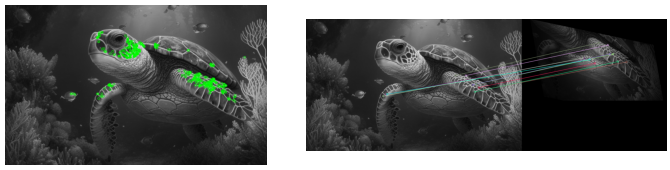

In [90]:


image = cv2.imread("image_1.png",cv2.IMREAD_COLOR)
image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
template = np.copy(image[170:470,260:870])
template = afine_transform(vignette(template,0.15))

orb = cv2.ORB_create()
#This is the detector we're going to use for the features.

kp1, des1 = orb.detectAndCompute(image,None)
kp2, des2 = orb.detectAndCompute(template,None)
# Here, we find the key points and their descriptors with the orb detector.

bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
# This is our BFMatcher object.

matches = bf.match(des1,des2)
matches = sorted(matches, key = lambda x:x.distance)
img_ = cv2.drawMatches(image,kp1,template,kp2,matches[:10],None, flags=2)

img_keypoints = cv2.drawKeypoints(image, kp1, image, color =(0,255,0),) 
axplots([img_keypoints,img_], figsize=(14.5,3.5) )

# Pooling

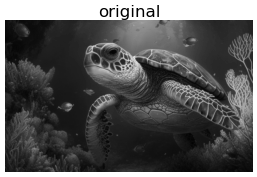

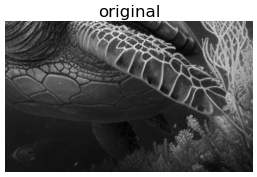

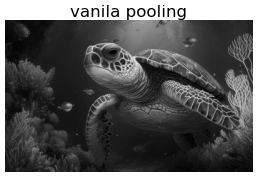

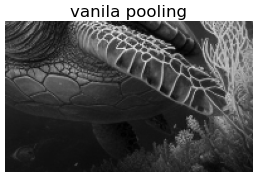

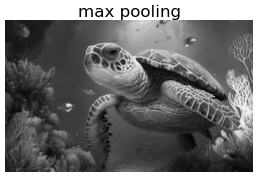

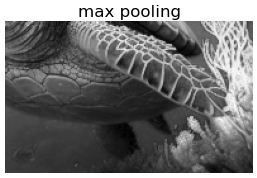

In [91]:
image      = cv2.imread("image_1.png",cv2.IMREAD_COLOR)
image_rgb  = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

plt.imshow(image_gray, cmap='gray');plt.axis('off'); plt.title('original', fontsize = 24); plt.show();
plt.imshow(image_gray[2*100:2*220,2*200:2*400], cmap='gray');plt.axis('off'); plt.title('original', fontsize = 24); plt.show(); 

image_mp = image_gray[::2,::2]
plt.imshow(image_mp, cmap='gray');plt.axis('off'); plt.title('vanila pooling', fontsize = 24); plt.show();
plt.imshow(image_mp[100:220,200:400], cmap='gray');plt.axis('off'); plt.title('vanila pooling', fontsize = 24); plt.show(); 

def maxpooling_channel(image,step=2, kernel = 2):
    w,h = image.shape[:2]
    new_image = np.zeros(((w-kernel)//step+1,(h-kernel)//step+1))

    for x,y in itertools.product(range(0,w-kernel,step),range(0,h-kernel,step)):
        image_part = image[x:x+kernel,y:y+kernel]

        new_image[x//step,y//step]  = np.max(image_part)
    return new_image.astype(int)    
        
image_mp = maxpooling_channel(image,step=2, kernel = 2)    

plt.imshow(image_mp, cmap='gray');plt.axis('off'); plt.title('max pooling', fontsize = 24); plt.show();
plt.imshow(image_mp[100:220,200:400], cmap='gray');plt.axis('off'); plt.title('max pooling', fontsize = 24); plt.show(); 



In [92]:
image.shape

(485, 793, 3)

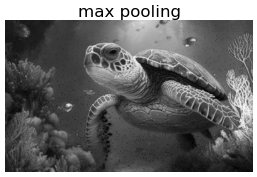

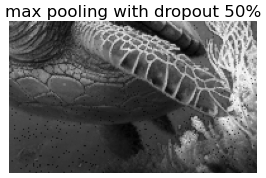

In [93]:
def maxpooling_dropout_channel(image,step=2, kernel = 2, drop_rate = 0.5):
    w,h = image.shape[:2]
    new_image = np.zeros(((w-kernel)//step+1,(h-kernel)//step+1))

    for x,y in itertools.product(range(0,w-kernel,step),range(0,h-kernel,step)):
        image_part = image[x:x+kernel,y:y+kernel].reshape(-1)
        new_image[x//step,y//step]  = np.max( np.random.choice(image_part, size = int(drop_rate*image_part.size), replace = False) )
    return new_image.astype(int)    
        
image_mp = maxpooling_dropout_channel(image,step=2, kernel = 2)    

plt.imshow(image_mp, cmap='gray');plt.axis('off'); plt.title('max pooling', fontsize = 24); plt.show();
plt.imshow(image_mp[100:220,200:400], cmap='gray');plt.axis('off'); plt.title('max pooling with dropout 50%', fontsize = 24); plt.show(); 

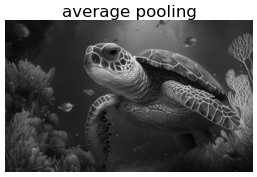

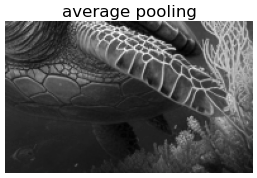

In [94]:
def averagepooling_channel(image,step=2, kernel = 2):
    w,h = image.shape[:2]
    new_image = np.zeros(((w-kernel)//step+1,(h-kernel)//step+1))

    for x,y in itertools.product(range(0,w-kernel,step),range(0,h-kernel,step)):
        image_part = image[x:x+kernel,y:y+kernel]

        new_image[x//step,y//step]  = np.mean(image_part)
    return new_image.astype(int)    
        
image_mp = averagepooling_channel(image,step=2, kernel = 2)    

plt.imshow(image_mp, cmap='gray');plt.axis('off'); plt.title('average pooling', fontsize = 24); plt.show();    
plt.imshow(image_mp[100:220,200:400], cmap='gray');plt.axis('off'); plt.title('average pooling', fontsize = 24); plt.show(); 

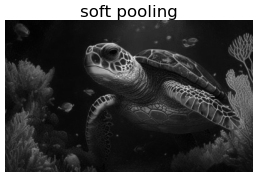

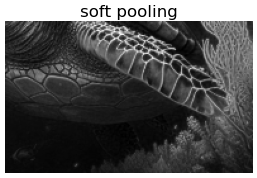

In [95]:
def softpooling_channel(image,step=2, kernel = 2):
    w,h = image.shape[:2]
    new_image = np.zeros(((w-kernel)//step+1,(h-kernel)//step+1)).astype(float)

    for x,y in itertools.product(range(0,w-kernel,step),range(0,h-kernel,step)):
        image_part = image[x:x+kernel,y:y+kernel].reshape(-1).astype(float)
        p = (image_part-np.mean(image_part))/(np.std(image_part)+1e-7)
        p = np.exp(-1*p)
        p /= (np.sum(p)+1e-7)
#         pout =  np.argmax(image_part*p)
        new_image[x//step,y//step]  = np.sum(image_part*p)#image_part[pout]
    return new_image.astype(int)    
        
image_mp = softpooling_channel(image,step=2, kernel = 2)    

plt.imshow(image_mp, cmap='gray');plt.axis('off'); plt.title('soft pooling', fontsize = 24); plt.show();    
plt.imshow(image_mp[100:220,200:400], cmap='gray');plt.axis('off'); plt.title('soft pooling', fontsize = 24); plt.show(); 

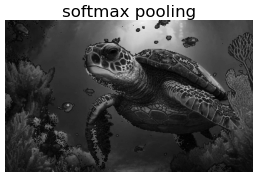

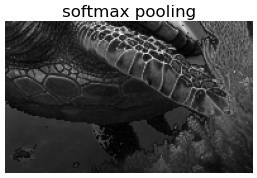

In [96]:
def softmaxpooling_channel(image,step=2, kernel = 2):
    w,h = image.shape[:2]
    new_image = np.zeros(((w-kernel)//step+1,(h-kernel)//step+1)).astype(float)

    for x,y in itertools.product(range(0,w-kernel,step),range(0,h-kernel,step)):
        image_part = image[x:x+kernel,y:y+kernel].reshape(-1).astype(float)
        p = (image_part-np.mean(image_part))/(np.std(image_part)+1e-7)
        p = np.exp(-1*p)
        p /= (np.sum(p)+1e-7)
        pout =  np.argmax(image_part*p)
        new_image[x//step,y//step]  = image_part[pout]
    return new_image.astype(int)    
        
image_mp = softmaxpooling_channel(image,step=2, kernel = 2)    

plt.imshow(image_mp, cmap='gray');plt.axis('off'); plt.title('softmax pooling', fontsize = 24); plt.show();
plt.imshow(image_mp[100:220,200:400], cmap='gray');plt.axis('off'); plt.title('softmax pooling', fontsize = 24); plt.show(); 

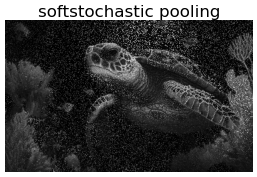

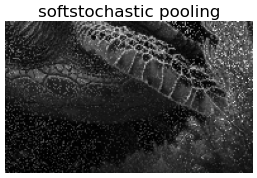

In [97]:
def softstochastic_pooling_channel(image,step=2, kernel = 2):
    w,h = image.shape[:2]
    new_image = np.zeros(((w-kernel)//step+1,(h-kernel)//step+1))

    for x,y in itertools.product(range(0,w-kernel,step),range(0,h-kernel,step)):
        image_part = image[x:x+kernel,y:y+kernel].reshape(-1)
        p = (image_part-np.mean(image_part))/(np.std(image_part)+1e-7)
        p = np.exp(-1*p)
        p /= (np.sum(p)+1e-7)

        new_image[x//step,y//step]  = np.random.choice(image_part,p=p)
    return new_image.astype(int)    
        
image_mp = softstochastic_pooling_channel(image,step=2, kernel = 2)    

plt.imshow(image_mp, cmap='gray');plt.axis('off'); plt.title('softstochastic pooling', fontsize = 24); plt.show();
plt.imshow(image_mp[100:220,200:400], cmap='gray');plt.axis('off'); plt.title('softstochastic pooling', fontsize = 24); plt.show(); 

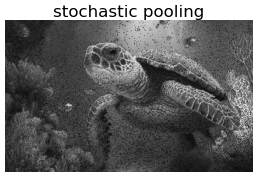

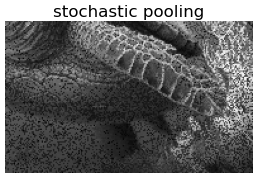

In [98]:
def stochastic_pooling_channel(image,step=2, kernel = 2):
    w,h = image.shape[:2]
    new_image = np.zeros(((w-kernel)//step+1,(h-kernel)//step+1))

    for x,y in itertools.product(range(0,w-kernel,step),range(0,h-kernel,step)):
        image_part = image[x:x+kernel,y:y+kernel].reshape(-1)
        p = image_part.astype('float')+1e-3 #(image_part-np.mean(image_part))/(np.std(image_part)+1e-7)
#         p = np.exp(-1*p)
        p /= (np.sum(p)+1e-12)
#         print(sum(p),x,y,image_part)

        new_image[x//step,y//step]  = np.random.choice(image_part,p=p)
    return new_image.astype(int)    
        
image_mp = stochastic_pooling_channel(image,step=2, kernel = 2)    

plt.imshow(image_mp, cmap='gray');plt.axis('off'); plt.title('stochastic pooling', fontsize = 24); plt.show();
plt.imshow(image_mp[100:220,200:400], cmap='gray');plt.axis('off'); plt.title('stochastic pooling', fontsize = 24); plt.show(); 

# Interpolation

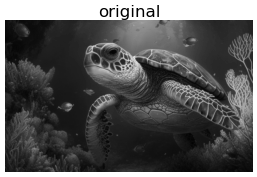

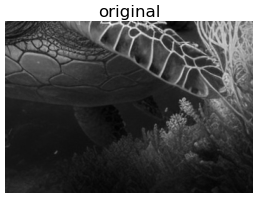

In [99]:
image      = cv2.imread("image_1.png",cv2.IMREAD_COLOR)
image_rgb  = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
image_small = image_gray[2*120:2*260,2*220:2*450]
plt.imshow(image_gray, cmap='gray');plt.axis('off'); plt.title('original', fontsize = 24); plt.show();
plt.imshow(image_small, cmap='gray');plt.axis('off'); plt.title('original', fontsize = 24); plt.show(); 

In [100]:
def show(image, k=4, name='Original', fontsize = 32):
    image_ = np.asarray(image)
    plt.imshow(image_, cmap='gray');
    plt.axis('off'); 
    plt.title(name, fontsize = 24); 
    plt.show();
    
    plt.imshow(image_[k*50:k*140,k*120:k*220,:]);
    plt.axis('off'); 
    plt.title(name, fontsize = fontsize); 
    plt.show(); 

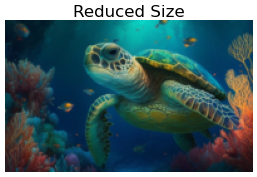

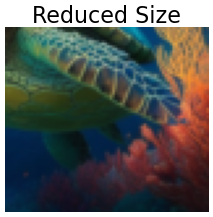

In [101]:
from PIL import Image
w,h,c = image_rgb.shape

K_Size = 4

image_small = Image.fromarray(image_rgb).resize((h//K_Size,w//K_Size),resample = Image.BILINEAR)


show(image_small,1, 'Reduced Size')

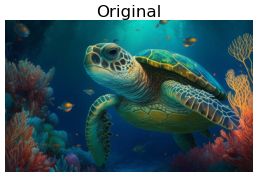

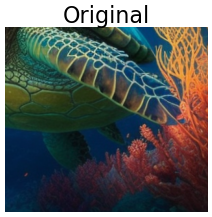

In [102]:
w,h,c = image_rgb.shape

image_ = image_small.resize((h,w),resample=Image.BILINEAR)

show(image_rgb,K_Size,'Original')

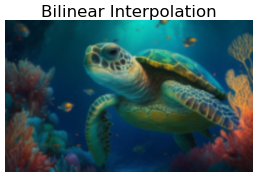

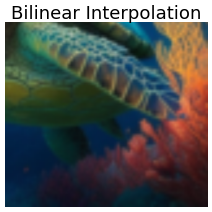

In [103]:
w,h,c = image_rgb.shape

image_ = image_small.resize((h,w),resample=Image.BILINEAR)

show(image_,K_Size,'Bilinear Interpolation',26)

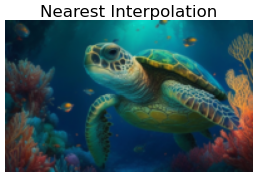

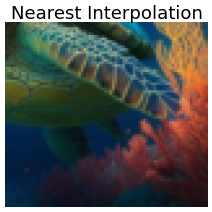

In [104]:
w,h,c = image_rgb.shape

image_ = image_small.resize((h,w),resample=Image.NEAREST)

show(image_,K_Size,'Nearest Interpolation',26)

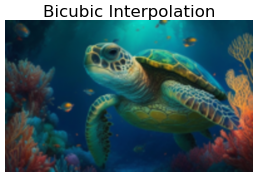

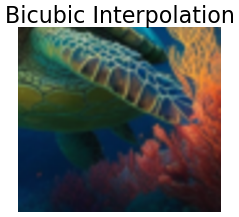

In [105]:
w,h,c = image_rgb.shape

image_ = image_small.resize((h,w),resample=Image.BICUBIC)

show(image_,K_Size,'Bicubic Interpolation')

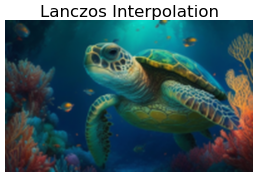

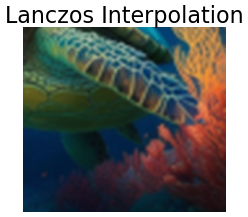

In [106]:
w,h,c = image_rgb.shape

image_ = image_small.resize((h,w),resample=Image.LANCZOS)

show(image_,K_Size,'Lanczos Interpolation')

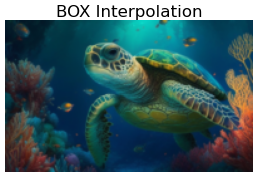

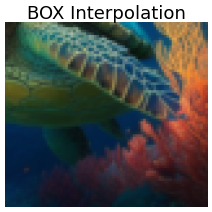

In [107]:
w,h,c = image_rgb.shape

image_ = image_small.resize((h,w),resample=Image.BOX)

show(image_,K_Size,'BOX Interpolation',26)

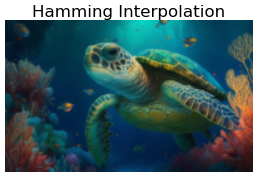

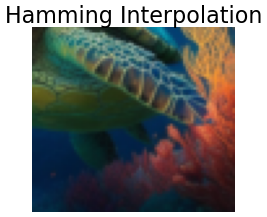

In [108]:
w,h,c = image_rgb.shape

image_ = image_small.resize((h,w),resample=Image.HAMMING)

show(image_,K_Size,'Hamming Interpolation')